# A Network of Thrones - Season 4

---



**Marco Uderzo, ID 2096998**


marco.uderzo@studenti.unipd.it

In [1]:
!pip install igraph
!pip install cairocffi
!pip install scikit-network
!pip install networkx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 900.7 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 18.6 MB/s eta 0:00:00


In [2]:
import pandas as pd
import itertools
import networkx as nx
import igraph as ig
import ast
import cairocffi as cairo
import random
import math
import json
import numpy as np
import matplotlib.pyplot as plt
from sknetwork.clustering import get_modularity

In [3]:
from google.colab import drive
drive.mount('/content/drive')
folder = 'drive/MyDrive/NetworkScience/'

Mounted at /content/drive


In [4]:
relations_df = pd.read_csv(folder+"data/got-s4-edges.csv")
characters_df  = pd.read_csv(folder+"data/got-s4-nodes.csv")

In [5]:
# Delete self-loops - there are no self-loops in the data.

#self_loop = []
#for i in range(len(relations)):
#  if relations["Source"][i] == relations["Target"][i]:
#    self_loop.append(i)
#
#
#relations = relations.drop(set(self_loop)).reset_index()

In [6]:
import networkx as nx

# Check for duplicate Ids
duplicates = characters_df[characters_df.duplicated('Id', keep=False)]
if not duplicates.empty:
    print("Duplicate Ids found in characters_df:")
    print(duplicates)

# Remove duplicates based on Id (keeping the first occurrence)
characters_df = characters_df.drop_duplicates(subset='Id')

# Create the NetworkX graph from the edge list
G = nx.from_pandas_edgelist(relations_df, 'Source', 'Target', ['Weight'])

# Convert characters DataFrame to dictionary and add nodes with attributes
characters = characters_df.set_index('Id').to_dict('index')

G.add_nodes_from(characters.items())
print(G.nodes(data=True))
print(G.edges(data=True))


[('ARYA', {'Label': 'Arya'}), ('HOUND', {'Label': 'Sandor'}), ('JAIME', {'Label': 'Jaime'}), ('TYRION', {'Label': 'Tyrion'}), ('CERSEI', {'Label': 'Cersei'}), ('DAENERYS', {'Label': 'Daenerys'}), ('JORAH', {'Label': 'Jorah'}), ('TYWIN', {'Label': 'Tywin'}), ('LITTLEFINGER', {'Label': 'Petyr'}), ('SANSA', {'Label': 'Sansa'}), ('JON', {'Label': 'Jon'}), ('SAM', {'Label': 'Sam'}), ('LYSA', {'Label': 'Lysa'}), ('BRONN', {'Label': 'Bronn'}), ('PODRICK', {'Label': 'Podrick'}), ('GILLY', {'Label': 'Gilly'}), ('OBERYN', {'Label': 'Oberyn'}), ('BRIENNE', {'Label': 'Brienne'}), ('SHAE', {'Label': 'Shae'}), ('ALLISER_THORNE', {'Label': 'Alliser Thorne'}), ('JOFFREY', {'Label': 'Joffrey'}), ('MISSANDEI', {'Label': 'Missandei'}), ('RAMSAY', {'Label': 'Ramsay'}), ('THEON', {'Label': 'Theon'}), ('DAARIO', {'Label': 'Daario'}), ('GRENN', {'Label': 'Grenn'}), ('DAVOS', {'Label': 'Davos'}), ('STANNIS', {'Label': 'Stannis'}), ('GREY_WORM', {'Label': 'Grey Worm'}), ('MANCE', {'Label': 'Mance'}), ('ELLARIA

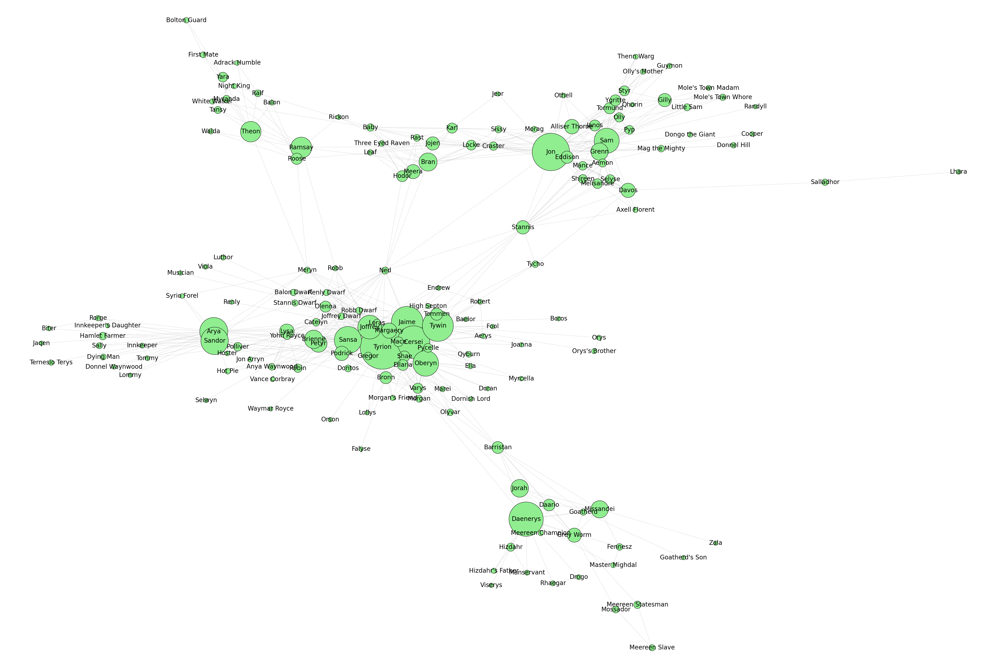

In [7]:
g = ig.Graph.from_networkx(G)

# Generate the spring layout using NetworkX
spring_layout = nx.spring_layout(G)

# Prepare colors for the nodes
node_colors = ["LightGreen" for _ in range(len(G.nodes()))]

# Apply PageRank
pagerank_scores = g.pagerank(weights='Weight')
pagerank_scores = np.array(pagerank_scores)
pagerank_scores_log = np.log1p(pagerank_scores)

# Set the node sizes based on PageRank
min_size = 20  # Minimum node size
max_size = 200  # Maximum node size
size_range = max_size - min_size
node_sizes = min_size + size_range * (pagerank_scores_log - np.min(pagerank_scores_log)) / (np.max(pagerank_scores_log) - np.min(pagerank_scores_log))

# Add positions to igraph nodes
positions = spring_layout
g.vs["x"] = [positions[node][0] for node in G.nodes()]
g.vs["y"] = [positions[node][1] for node in G.nodes()]
g.vs["pagerank"] = pagerank_scores

# Plot the graph with igraph
fig, ax = plt.subplots(figsize=(45, 30))
ax.set_xlim(min(g.vs["x"])-0.05, max(g.vs["x"])+0.05)
ax.set_ylim(min(g.vs["y"])-0.05, max(g.vs["y"])+0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"] if "Label" in g.vs.attributes() else None,
    vertex_label_size=20,
    edge_color="grey",
    edge_width=0.5
)

plt.show()



Let's list the various characters

In [8]:
for nm in g.vs():
  print(nm['Label'])

Arya
Sandor
Jaime
Tyrion
Cersei
Daenerys
Jorah
Tywin
Petyr
Sansa
Jon
Sam
Lysa
Bronn
Podrick
Gilly
Oberyn
Brienne
Shae
Alliser Thorne
Joffrey
Missandei
Ramsay
Theon
Daario
Grenn
Davos
Stannis
Grey Worm
Mance
Ellaria
Bran
Meera
Margaery
Olenna
Robin
Hodor
Jojen
Tommen
Eddison
Janos
Roose
Melisandre
Selyse
Tormund
Barristan
Varys
Pyp
Styr
Ygritte
Dontos
Yohn Royce
Polliver
Pycelle
Shireen
Aemon
Hizdahr
Mole's Town Whore
Hot Pie
Anya Waynwood
Locke
Mace
Olyvar
Hamlet Farmer
Little Sam
Yara
Qyburn
Tycho
Morgan
Gregor
Ralf
Ternesio Terys
Karl
Myranda
Fennesz
Tansy
Salladhor
Elia
Loras
Olly
Rast
Dying Man
Catelyn
Sally
Sissy
Morgan's Friend
Three Eyed Raven
Craster
Marei
Balon Dwarf
Robb Dwarf
Donnel Hill
Morag
Bolton Guard
Leaf
Meereen Champion
Dongo the Giant
Mag the Mighty
Dornish Lord
Endrew
Guymon
Hizdahr's Father
Mole's Town Madam
Ned
Renly Dwarf
Stannis Dwarf
Othell
Balon
Myrcella
Meereen Statesman
Mossador
First Mate
Goatherd
Rorge
Joffrey Dwarf
Jon Arryn
Meryn
Orson
Master Mighdal
Hi

### Size

In [9]:
nodes = g.vs()
edges = g.es()

print("Number of possible edges (N*(N-1)):", int(len(nodes)*(len(nodes)-1)/2))
print("Number of nodes (Graph Order):", len(nodes))
print("Number of edges (Graph Size):", len(edges))

# Graph Density: how connected are the nodes. Calculated by: n_edges/n_possible_edges
print("Graph Density:", g.density())

Number of possible edges (N*(N-1)): 14196
Number of nodes (Graph Order): 169
Number of edges (Graph Size): 664
Graph Density: 0.04677373908143139


### Distribution

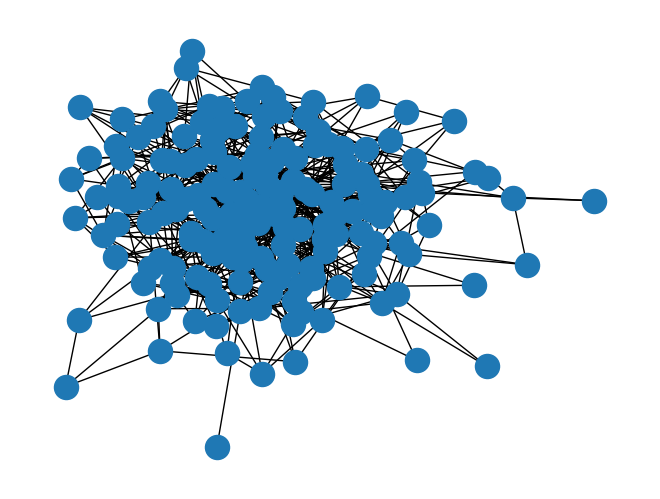

In [10]:
#Generate an appropriate ensemble of null-model networks, such as Erdős–Rényi random graphs, or Maslov–Sneppen random graphs.
rand_net = nx.erdos_renyi_graph(len(G.nodes()), len(G.edges())/(len(G.nodes())*(len(G.nodes()) - 1)/2), seed=None, directed=False)
nx.draw(rand_net)

In [11]:
#Calculate the average of the mean shortest path length Lr over this ensemble of null-model networks; calculate Cr analogously.
print("number of nodes in random net:", len(rand_net.nodes()), "number of edges in random net", len(rand_net.edges()))
print("average shortest path for the random network", nx.average_shortest_path_length(rand_net))
print("clustering coefficient for the random network", nx.average_clustering(rand_net))

number of nodes in random net: 169 number of edges in random net 650
average shortest path for the random network 2.7393632009016624
clustering coefficient for the random network 0.049065365929271215


In [12]:
if nx.is_connected(G):
    avg_shortest_path = nx.average_shortest_path_length(G)
else:
    # Extract the largest connected component
    largest_cc = max(nx.connected_components(G), key=len)
    subgraph = G.subgraph(largest_cc)
    avg_shortest_path = nx.average_shortest_path_length(subgraph)


# Calculate the normalised shortest path λ:=L/Lr. and γ:=C/Cr
print("normalised average shortest path for the original network", avg_shortest_path / nx.average_shortest_path_length(rand_net))
print("normalised clustering coefficient for the original network", nx.average_clustering(G) / nx.average_clustering(rand_net))


normalised average shortest path for the original network 1.2674603990948365
normalised clustering coefficient for the original network 13.584124546509997


The idea is that:
- Small-world networks should have some spatial structure, which is reflected by a high clustering coefficient.
By contrast, random networks have no such structure and a low clustering coefficient.
- Small-world networks are efficient in communicating and similar and thus have a small shortest path length,
comparable to that of random networks. By contrast, purely spatial networks have a high shortest path length.

In [13]:
# Calculate the normalised shortest path λ:=L/Lr. and γ:=C/Cr
lambda_val = avg_shortest_path / nx.average_shortest_path_length(rand_net)
gamma_val = nx.average_clustering(G) / nx.average_clustering(rand_net)

# Check small-world criteria
if lambda_val >= 1 and gamma_val > 1:
    print("This network is a small-world network")
    print(f"Lambda value: {lambda_val}, Gamma value: {gamma_val}")
else:
    print("This network is not a small-world network")
    print(f"Lambda value: {lambda_val}, Gamma value: {gamma_val}")


This network is a small-world network
Lambda value: 1.2674603990948365, Gamma value: 13.584124546509997


In [14]:
# Using nx.sigma() and nx.omega() to further validate that the graph is indeed of small-world type

#sigma = nx.sigma(G, niter=5, nrand=10, seed=None)
#if sigma > 1:
#  print("Small-world: The value of sigma is", sigma) # yes
#
#
#omega = nx.omega(G, niter=5, nrand=10, seed=None)
#
#if omega < 0.3 and omega > -0.3:
#  print("Small-world: The value of omega is",  omega) # yes

### Connectedness

In [15]:
if(g.is_connected()):
  print("Graph is connected")
else:
  print("Graph is not connected")

Graph is connected


### Diameter

The diameter is the highest distance in the network

In [16]:
print("Graph Diameter:", g.diameter(directed=False))

Graph Diameter: 8


Path between most distant nodes: ['Bolton Guard', 'Yara', 'Ramsay', 'Robb', 'Joffrey', 'Barristan', 'Grey Worm', 'Meereen Statesman', 'Meereen Slave']


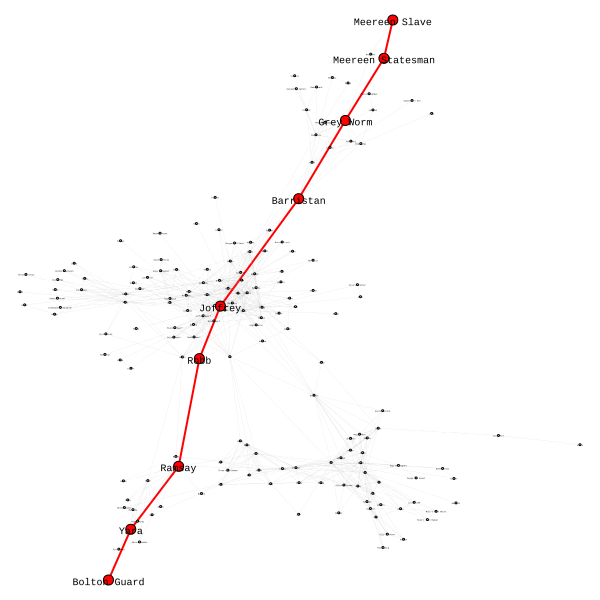

In [17]:
import networkx as nx
import igraph as ig

# Calculate the diameter path using igraph
d = g.get_diameter()

# GET NODES IN THE DIAMETER PATH
diameter_path = d

# GET EDGES IN THE DIAMETER PATH
diameter_edges = g.get_eids(pairs=[(d[i], d[i+1]) for i in range(len(d)-1)], directed=False)

# Visual style for plotting
visual_style = {
    "vertex_color": ["red" if node.index in diameter_path else "white" for node in g.vs],
    "edge_color": ["red" if edge.index in diameter_edges else "grey" for edge in g.es],
    "edge_width": [2 if edge.index in diameter_edges else 0.1 for edge in g.es],
    "vertex_label": [node["Label"] for node in g.vs],
    "vertex_size": [10 if node.index in diameter_path else 2 for node in g.vs],
    "vertex_label_size": [10 if node.index in diameter_path else 2 for node in g.vs]

}

print("Path between most distant nodes:", [g.vs[index]["Label"] for index in diameter_path])



# Plot the graph
ig.plot(g, **visual_style)


### Shortest Paths

Shortest paths between Daenerys and other nodes [['Daenerys', 'Varys', 'Podrick', 'Arya'], ['Daenerys', 'Varys', 'Sansa', 'Arya'], ['Daenerys', 'Varys', 'Jaime', 'Arya'], ['Daenerys', 'Varys', 'Sandor', 'Arya'], ['Daenerys', 'Barristan', 'Joffrey', 'Arya'], ['Daenerys', 'Varys', 'Joffrey', 'Arya'], ['Daenerys', 'Varys', 'Sandor'], ['Daenerys', 'Varys', 'Jaime'], ['Daenerys', 'Varys', 'Tyrion'], ['Daenerys', 'Varys', 'Cersei'], ['Daenerys', 'Barristan', 'Cersei'], ['Daenerys'], ['Daenerys', 'Jorah'], ['Daenerys', 'Varys', 'Tywin'], ['Daenerys', 'Varys', 'Sansa', 'Petyr'], ['Daenerys', 'Varys', 'Tywin', 'Petyr'], ['Daenerys', 'Varys', 'Tyrion', 'Petyr'], ['Daenerys', 'Barristan', 'Joffrey', 'Petyr'], ['Daenerys', 'Varys', 'Joffrey', 'Petyr'], ['Daenerys', 'Varys', 'Sansa'], ['Daenerys', 'Varys', 'Joffrey', 'Stannis', 'Jon'], ['Daenerys', 'Barristan', 'Joffrey', 'Stannis', 'Jon'], ['Daenerys', 'Varys', 'Jaime', 'Stannis', 'Jon'], ['Daenerys', 'Varys', 'Tywin', 'Stannis', 'Jon'], ['Daenery

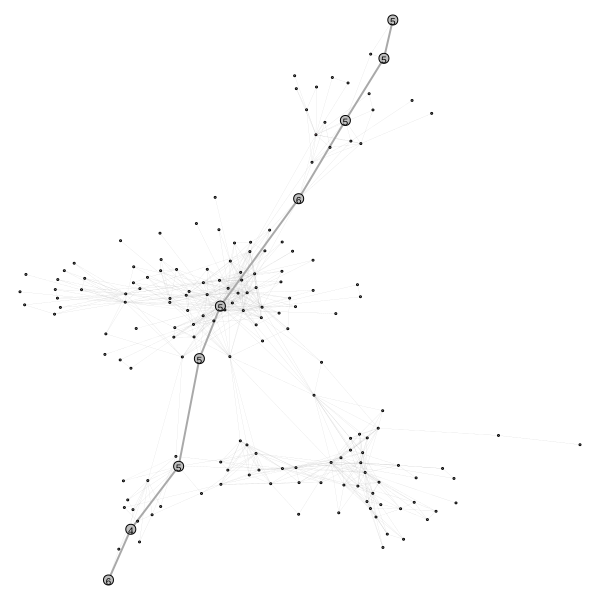

In [18]:
# SHORTEST PATHS
shortest_paths = {}
for node in nodes:
    shortest_paths[node["Label"]]=[nodes[v]["Label"] for v in g.get_all_shortest_paths(node)
                                                    ]
# SHOW DISTANCES OF SHORTEST PATHS BETWEEN ONE NODE AND EVERYBODY ELSE

node_name = "Daenerys"
print("Shortest paths between", node_name,"and other nodes", shortest_paths[node_name])

distances = [len(path) for path in shortest_paths[node_name]]

visual_style["vertex_color"] = ["pink" if node["Label"]==node_name else "grey" for node in nodes]
visual_style["edge_color"] = "darkgrey"

visual_style["vertex_label"] = distances

ig.plot(g, **visual_style)

In [19]:
sp = dict(nx.shortest_path(G)) #between all nodes
print(sp)

<class 'networkx.utils.decorators.argmap'> compilation 58:3: FutureWarning: 

shortest_path will return an iterator that yields
(node, path) pairs instead of a dictionary when source
and target are unspecified beginning in version 3.5

To keep the current behavior, use:

	dict(nx.shortest_path(G))


{'ARYA': {'ARYA': ['ARYA'], 'HOUND': ['ARYA', 'HOUND'], 'BRIENNE': ['ARYA', 'BRIENNE'], 'POLLIVER': ['ARYA', 'POLLIVER'], 'TERNESIO_TERYS': ['ARYA', 'TERNESIO_TERYS'], 'FARMER_HAMLET': ['ARYA', 'FARMER_HAMLET'], 'DYING_MAN': ['ARYA', 'DYING_MAN'], 'SALLY': ['ARYA', 'SALLY'], 'RORGE': ['ARYA', 'RORGE'], 'CATELYN': ['ARYA', 'CATELYN'], 'HOT_PIE': ['ARYA', 'HOT_PIE'], 'JOFFREY': ['ARYA', 'JOFFREY'], 'NED': ['ARYA', 'NED'], 'PODRICK': ['ARYA', 'PODRICK'], 'SANSA': ['ARYA', 'SANSA'], 'DONNEL_WAYNWOOD': ['ARYA', 'DONNEL_WAYNWOOD'], 'INNKEEPER': ['ARYA', 'INNKEEPER'], 'INNKEEPERS_DAUGHTER': ['ARYA', 'INNKEEPERS_DAUGHTER'], 'JAIME': ['ARYA', 'JAIME'], 'JAQEN': ['ARYA', 'JAQEN'], 'LOMMY': ['ARYA', 'LOMMY'], 'LYSA': ['ARYA', 'LYSA'], 'MERYN_TRANT': ['ARYA', 'MERYN_TRANT'], 'SYRIO_FOREL': ['ARYA', 'SYRIO_FOREL'], 'TOMMY': ['ARYA', 'TOMMY'], 'BITER': ['ARYA', 'HOUND', 'BITER'], 'MOUNTAIN': ['ARYA', 'HOUND', 'MOUNTAIN'], 'VARYS': ['ARYA', 'HOUND', 'VARYS'], 'CERSEI': ['ARYA', 'BRIENNE', 'CERSEI'], 

In [20]:
i = 0
for _, v in sp.items():
  for char, dic in v.items():
    if len(dic) == len(diameter_path):
      i = i+1

print("The number of the shortest path long as the diameter are", i)

The number of the shortest path long as the diameter are 14


In [21]:
# AVERAGE SHORTEST PATH LENGTH - HOW CLOSE ARE THE NODES TO EACH OTHER ON AVERAGE
# Check if G is connected (for NetworkX)
if nx.is_connected(G):
    avg_shortest_path = nx.average_shortest_path_length(G)
else:
    # Extract the largest connected component
    largest_cc = max(nx.connected_components(G), key=len)
    subgraph = G.subgraph(largest_cc)
    avg_shortest_path = nx.average_shortest_path_length(subgraph)

print("Average shortest path length:", avg_shortest_path)

Average shortest path length: 3.4720343758805297


### Node Degrees

In [22]:
# CONNECTIVITY - HOW WELL CONNECTED A NODE IS

def sum_neigh_degree(graph): # compute the sum of neighbors' degrees
    data = {}
    for node in graph.vs:
        neighbors = graph.neighbors(node, mode="all")
        neighbors_degrees = [graph.degree(neigh) for neigh in neighbors]
        data[node.index] = sum(neighbors_degrees) / len(neighbors_degrees) if neighbors_degrees else 0
    return data


print("Node degrees:"),

# Compute the average degree of each node’s neighbors
sum_neigh_degree = sum_neigh_degree(g)

# Prepare data for DataFrame
degree = [v.degree() for v in g.vs]
average_neigh_degree = [sum_neigh_degree[v.index] for v in g.vs]

degree_df = pd.DataFrame({
    'Node': g.vs["Label"],
    'Degree': degree,
    "Average degree of node's neighbours": average_neigh_degree
})

degree_df = degree_df.sort_values(by=['Degree'], ascending=False)

# Print results
print("First 10 nodes with highest degree")
print(degree_df.head(10))
print("\n")
print("Last 5 nodes with lowest degree")
print(degree_df.tail(5))



Node degrees:
First 10 nodes with highest degree
       Node  Degree  Average degree of node's neighbours
20  Joffrey      40                            14.250000
3    Tyrion      38                            13.631579
4    Cersei      33                            14.666667
9     Sansa      31                            15.935484
10      Jon      30                            11.166667
2     Jaime      29                            16.551724
7     Tywin      28                            15.821429
16   Oberyn      25                            16.000000
11      Sam      25                            11.920000
0      Arya      24                            10.166667


Last 5 nodes with lowest degree
             Node  Degree  Average degree of node's neighbours
150         Boros       1                                 29.0
146         Jaqen       1                                 24.0
143         Renly       1                                 40.0
136        Selwyn       1             

In [23]:
dmax = max(degree_df['Degree'])
print(f'maximum degree: {dmax}')
dmin = min(degree_df['Degree'])
print(f'minimum degree: {dmin}')
davg = np.mean(degree_df['Degree'])
print(f'average degree: {davg}')
dmostfreq = list(dict(degree_df['Degree'].value_counts()).items())[0]
print(f'most frequent degree (mode): {dmostfreq[0]} with {dmostfreq[1]} nodes')

maximum degree: 40
minimum degree: 1
average degree: 7.8579881656804735
most frequent degree (mode): 2 with 33 nodes


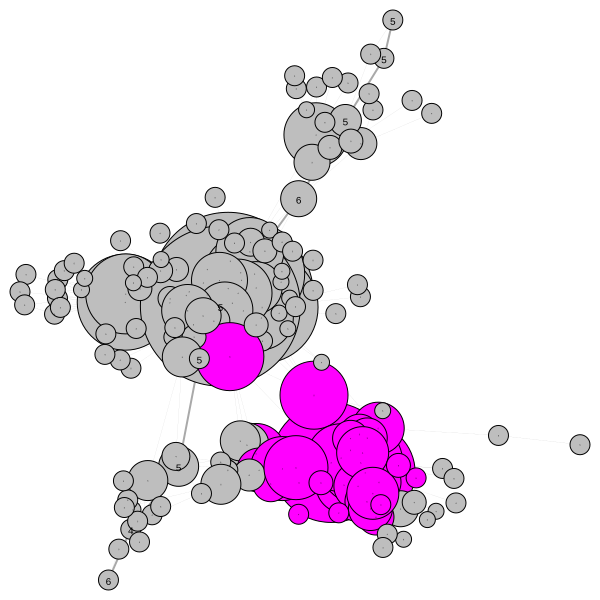

In [24]:
#SET SIZE PROP TO DEGREE
visual_style["vertex_size"] = [4*degree if degree>3 else 20 for degree in g.degree()]

#COLOR NEAREST NEIGHBORS OF A CERTAIN NODE
node_name = "Jon"
for node in nodes:
    if node["Label"] == node_name:
        node_index = node.index

neighbors = g.neighborhood(nodes[node_index],order=1)
visual_style["vertex_color"] = ["fuchsia" if node.index in neighbors else "grey" for node in nodes]
visual_style["edge_color"] = "darkgrey"

ig.plot(g, **visual_style)

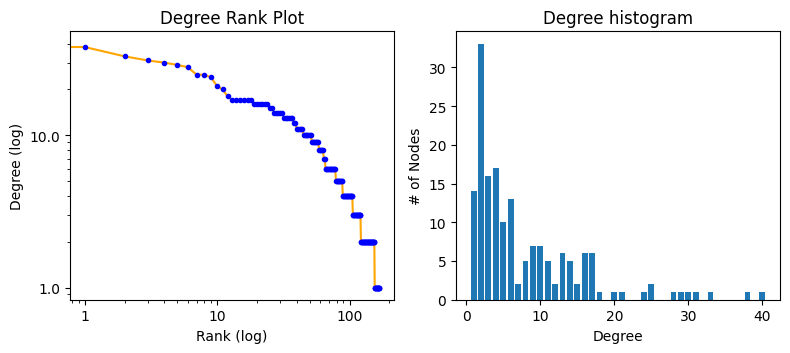

In [25]:
from matplotlib.ticker import ScalarFormatter


fig = plt.figure("Degree ", figsize=(8, 8))

axgrid = fig.add_gridspec(5, 4)

ax0 = fig.add_subplot(axgrid[3:, :2])
# Plot the line in orange
ax0.plot(sorted(degree_df['Degree'], reverse=True), "orange")
# Plot the dots in blue
ax0.plot(sorted(degree_df['Degree'], reverse=True), "bo", markersize=3)
ax0.set_title("Degree Rank Plot")
ax0.set_ylabel("Degree (log)")
ax0.set_xlabel("Rank (log)")
ax0.set_xscale('log')
ax0.set_yscale('log')

ax0.xaxis.set_major_formatter(ScalarFormatter())
ax0.yaxis.set_major_formatter(ScalarFormatter())

ax1 = fig.add_subplot(axgrid[3:, 2:])
unique, counts = np.unique(degree_df['Degree'], return_counts=True)
ax1.bar(unique, counts)
ax1.set_title("Degree histogram")
ax1.set_xlabel("Degree")
ax1.set_ylabel("# of Nodes")

fig.tight_layout()
plt.show()


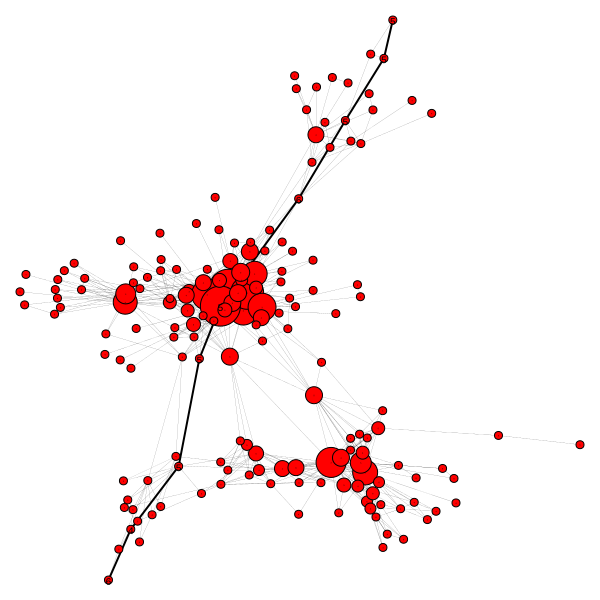

In [26]:
visual_style["vertex_size"] = [degree if degree>10 else 8 for degree in g.degree()]
visual_style['edge_color'] = 'black'
visual_style['vertex_color'] = 'red'
ig.plot(g, **visual_style)

### Bridges

An edge is a bridge if its removal increases the number of (weakly) connected components in the graph.

In [27]:
bridges = g.bridges()

if bridges:
    print("The network has bridges.")
    bridge_labels = [(g.vs[g.es[bridge].source]["Label"], g.vs[g.es[bridge].target]["Label"]) for bridge in bridges]
    print("The bridges are:", bridge_labels)
else:
    print("The network doesn't have any bridges")

print("Number of bridges:", len(bridges))

The network has bridges.
The bridges are: [('Arya', 'Ternesio Terys'), ('Arya', 'Jaqen'), ('Jaime', 'Boros'), ('Tyrion', 'Orson'), ('Daenerys', 'Viserys'), ('Sansa', 'Waymar Royce'), ('Sam', 'Randyll'), ('Bronn', 'Falyse'), ('Brienne', 'Selwyn'), ('Joffrey', 'Renly'), ('Missandei', 'Zala'), ('Davos', 'Salladhor'), ('Olenna', 'Musician'), ('Salladhor', 'Lhara'), ('Goatherd', "Goatherd's Son")]
Number of bridges: 15


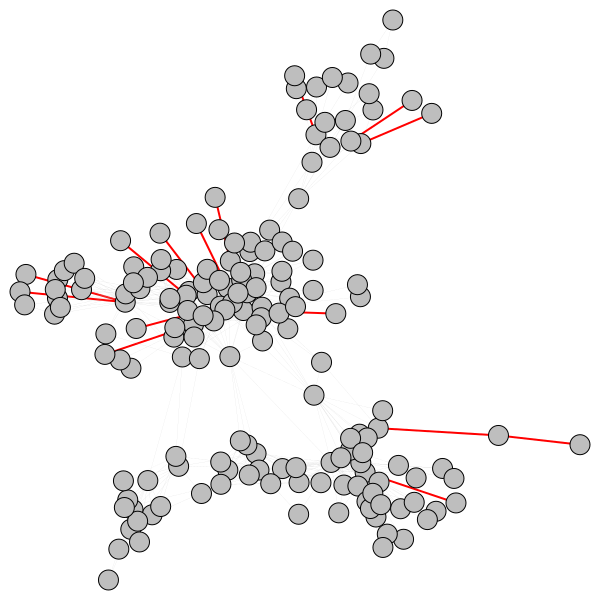

In [28]:
visual_style = {}

bridges_index = g.bridges()

visual_style["vertex_color"] = 'grey'
visual_style["edge_color"] = ["red" if edge.index in bridges_index else "grey" for edge in edges]
#visual_style["vertex_label"] = [g.vs[edge.source]["Label"] for edge in edges]
visual_style["edge_width"] = [2 if edge.index in bridges_index else 0.1 for edge in edges]
#visual_style["vertex_label_size"] = [10 if edge.index in bridges_index else 2 for edge in edges]

ig.plot(g, **visual_style)

### Giant Components



In [29]:
clusters = g.connected_components()
clusters = sorted(clusters, key=len, reverse=True)

# Get the largest connected component
largest_cc = clusters[0]
G0 = g.subgraph(largest_cc)

# Check if the original graph is isomorphic to the largest connected component
if g.isomorphic(G0):
    print("This network is connected and there are no isolated nodes")
else:
    print("This network has", len(clusters), "components")

This network is connected and there are no isolated nodes


### Centrality

In [30]:
# PageRank Centrality
pr_cen = nx.pagerank(G)
# Closeness centrality
clo_cen = nx.closeness_centrality(G)
# Betweenness centrality
bet_cen = nx.betweenness_centrality(G)
# Eigenvector centrality
eig_cen = nx.eigenvector_centrality(G)
# Harmonic centrality
har_cen = nx.harmonic_centrality(G)
# degree centrality
degree_cen = nx.degree_centrality(G)

centrality_df = pd.DataFrame(data = list(zip(bet_cen.keys(), bet_cen.values(), clo_cen.values(), eig_cen.values(), [1/x for x in list(har_cen.values())], degree_cen.values())),
                             columns = ['Node','Betweenness centrality', 'Closeness centrality', 'Eigenvector centrality', 'Harmonic centrality', 'Degree centrality'])
centrality_df

,Node,Betweenness centrality,Closeness centrality,Eigenvector centrality,Harmonic centrality,Degree centrality
0,ARYA,0.099856,0.384439,0.107720,0.015848,0.142857
1,HOUND,0.053397,0.360515,0.081516,0.016434,0.119048
2,JAIME,0.079395,0.435233,0.253863,0.018744,0.172619
3,TYRION,0.094245,0.413793,0.287560,0.019601,0.226190
4,CERSEI,0.076365,0.416873,0.270265,0.018329,0.196429
...,...,...,...,...,...,...
164,MUSICIAN,0.000000,0.255708,0.008560,0.023484,0.005952
165,ORYS,0.000000,0.292174,0.014832,0.025696,0.011905
166,ORYS_BROTHER,0.000000,0.292174,0.014832,0.024845,0.011905
167,RANDYLL,0.000000,0.253776,0.000945,0.016335,0.005952


In [31]:
print("Mean values of Centralities:")
print("PageRank:", np.mean(list(pr_cen.values())))
print("Betweenness:", np.mean(list(bet_cen.values())))
print("Closeness:", np.mean(list(clo_cen.values())))
print("Eigenvector:", np.mean(list(eig_cen.values())))
print("Harmonic:", 1/np.mean(list(har_cen.values())))
print("Degree:", np.mean(list(degree_cen.values())))

Mean values of Centralities:
PageRank: 0.0059171597633136085
Betweenness: 0.014802601053176826
Closeness: 0.2967975689017217
Eigenvector: 0.0407615938742678
Harmonic: 0.01737738574882992
Degree: 0.046773739081431384


In [32]:
def highest_centrality(centrality_dict):
  # Create ordered tuple of centrality data
  cent_items=[(b,a) for (a,b) in centrality_dict.items()]
  # Sort in descending order
  cent_items.sort()
  cent_items.reverse()
  return tuple(reversed(cent_items[0]))

def k_highest_centrality(centrality_dict, k):
  # Create ordered tuple of centrality data
  cent_items=[(b,a) for (a,b) in centrality_dict.items()]
  # Sort in descending order
  cent_items.sort()
  cent_items.reverse()
  return tuple(cent_items[0:k])

In [33]:
# PageRank centrality
highest_centrality_pr_cen = highest_centrality(pr_cen)
# Closeness centrality
highest_centrality_clo_cen = highest_centrality(clo_cen)
# Betweenness centrality
highest_centrality_bet_cen = highest_centrality(bet_cen)
# Eigenvector centrality
highest_centrality_eig_cen = highest_centrality(eig_cen)
# Harmonic centrality
highest_centrality_har_cen = highest_centrality(har_cen)
# degree centrality
highest_centrality_degree_cen = highest_centrality(degree_cen)

central_char = []
central_score =  []

central_char.extend([highest_centrality_clo_cen[0], highest_centrality_bet_cen[0], highest_centrality_eig_cen[0], highest_centrality_har_cen[0], highest_centrality_degree_cen[0]])
central_score.extend([highest_centrality_clo_cen[1], highest_centrality_bet_cen[1], highest_centrality_eig_cen[1], 1/highest_centrality_har_cen[1], highest_centrality_degree_cen[1]])

centrality_df = pd.DataFrame(data = list(zip(central_char, central_score)), columns = ['Most central character', 'Score'])
centrality_df

,Most central character,Score
0,JOFFREY,0.460274
1,JOFFREY,0.212174
2,JOFFREY,0.294165
3,JOFFREY,0.010733
4,JOFFREY,0.238095


In [34]:
def createCol(cen):
  central_char = []
  central_score =  []
  for i in range(len(cen)):
    central_char.append(cen[i][1])
    central_score.append(cen[i][0])
  return list(central_char), list(central_score)

#5 most central character

highest_centrality_pr_cen = k_highest_centrality(pr_cen, 5)
pr_cen_char, pr_cen_scores = createCol(highest_centrality_pr_cen)

highest_centrality_clo_cen = k_highest_centrality(clo_cen, 5)
clo_cen_char, clo_cen_scores = createCol(highest_centrality_clo_cen)

highest_centrality_bet_cen = k_highest_centrality(bet_cen, 5)
bet_cen_char, bet_cen_scores = createCol(highest_centrality_bet_cen)

highest_centrality_eig_cen = k_highest_centrality(eig_cen, 5)
eig_cen_char, eig_cen_scores = createCol(highest_centrality_eig_cen)

highest_centrality_har_cen = k_highest_centrality(har_cen, 5)
har_cen_char, har_cen_scores = createCol(highest_centrality_har_cen)

highest_centrality_degree_cen = k_highest_centrality(degree_cen, 5)
degree_cen_char, degree_cen_scores = createCol(highest_centrality_degree_cen)

centrality_df = pd.DataFrame(data = list(zip(bet_cen_char, bet_cen_scores, clo_cen_char, clo_cen_scores, eig_cen_char, eig_cen_scores, har_cen_char, [1/x for x in har_cen_scores], degree_cen_char, degree_cen_scores)),
                             columns = ['Most central character - Betweenness ', 'Score - Betweenness', 'Most central character - Closeness ', 'Score - Closeness ', 'Most central character - Eigenvector ', 'Score - Eigenvector ',
                             'Most central character - Harmonic ', 'Score - Harmonic ', 'Most central character - Degree ', 'Score - Degree '])
centrality_df

,Most central character - Betweenness,Score - Betweenness,Most central character - Closeness,Score - Closeness,Most central character - Eigenvector,Score - Eigenvector,Most central character - Harmonic,Score - Harmonic,Most central character - Degree,Score - Degree
0,JOFFREY,0.212174,JOFFREY,0.460274,JOFFREY,0.294165,JOFFREY,0.010733,JOFFREY,0.238095
1,NED,0.200773,JAIME,0.435233,TYRION,0.287560,TYRION,0.011507,TYRION,0.226190
2,STANNIS,0.184341,NED,0.427481,CERSEI,0.270265,JAIME,0.011567,CERSEI,0.196429
3,JON,0.150837,CERSEI,0.416873,SANSA,0.258949,CERSEI,0.011726,SANSA,0.184524
4,VARYS,0.112189,TYRION,0.413793,JAIME,0.253863,SANSA,0.011848,JON,0.178571


### Homophily

In [35]:
#Compute degree assortativity of graph.
#Assortativity measures the similarity of connections in the graph with respect to the node degree.
#This is the same as degree_assortativity_coefficient but uses the potentially faster scipy.stats.pearsonr function.
assortativity_coefficient = nx.degree_assortativity_coefficient(G, weight="Weight")
print("Degree assortativity coefficient:",nx.degree_pearson_correlation_coefficient(G,weight="Weight"))

Degree assortativity coefficient: -0.08227470375131576


In [36]:
#jaccard similarity between all couples of nodes
preds = nx.jaccard_coefficient(G, G.edges())

first_node = []
sec_node = []
score = []

for u, v, p in preds:
  first_node.append(u)
  sec_node.append(v)
  score.append(p)

jaccard_coefficient = pd.DataFrame(data = list(zip(first_node, sec_node, score)),
                             columns = ['First node', 'Second node', 'Score'])

jaccard_coefficient = jaccard_coefficient.sort_values("Score", ascending=False)
jaccard_coefficient

,First node,Second node,Score
546,MELISANDRE,SELYSE,0.818182
478,MEERA,HODOR,0.750000
411,GRENN,EDDISON_TOLLETT,0.727273
550,SELYSE,SHIREEN,0.727273
547,MELISANDRE,SHIREEN,0.727273
...,...,...,...
295,BRONN,FALYSE,0.000000
398,RAMSAY,ROBB,0.000000
154,DAENERYS,VISERYS,0.000000
499,OLENNA,MUSICIAN,0.000000


### Triangles

In [37]:
#list of all traingles
triangles_list = [(n,nbr,nbr2) for n in G for nbr, nbr2 in itertools.combinations(G[n],2) if nbr in G[nbr2]]
print("List of all the edges involved in the traingles")
triangles_list[:30]

List of all the edges involved in the traingles


[('ARYA', 'HOUND', 'BRIENNE'),
 ('ARYA', 'HOUND', 'POLLIVER'),
 ('ARYA', 'HOUND', 'FARMER_HAMLET'),
 ('ARYA', 'HOUND', 'DYING_MAN'),
 ('ARYA', 'HOUND', 'SALLY'),
 ('ARYA', 'HOUND', 'RORGE'),
 ('ARYA', 'HOUND', 'JOFFREY'),
 ('ARYA', 'HOUND', 'PODRICK'),
 ('ARYA', 'HOUND', 'DONNEL_WAYNWOOD'),
 ('ARYA', 'HOUND', 'INNKEEPER'),
 ('ARYA', 'HOUND', 'INNKEEPERS_DAUGHTER'),
 ('ARYA', 'HOUND', 'LOMMY'),
 ('ARYA', 'HOUND', 'LYSA'),
 ('ARYA', 'HOUND', 'MERYN_TRANT'),
 ('ARYA', 'HOUND', 'SYRIO_FOREL'),
 ('ARYA', 'HOUND', 'TOMMY'),
 ('ARYA', 'BRIENNE', 'CATELYN'),
 ('ARYA', 'BRIENNE', 'HOT_PIE'),
 ('ARYA', 'BRIENNE', 'JOFFREY'),
 ('ARYA', 'BRIENNE', 'NED'),
 ('ARYA', 'BRIENNE', 'PODRICK'),
 ('ARYA', 'BRIENNE', 'SANSA'),
 ('ARYA', 'BRIENNE', 'JAIME'),
 ('ARYA', 'POLLIVER', 'JOFFREY'),
 ('ARYA', 'POLLIVER', 'INNKEEPER'),
 ('ARYA', 'POLLIVER', 'TOMMY'),
 ('ARYA', 'FARMER_HAMLET', 'SALLY'),
 ('ARYA', 'CATELYN', 'JOFFREY'),
 ('ARYA', 'CATELYN', 'NED'),
 ('ARYA', 'CATELYN', 'SANSA')]

In [38]:
#number of triangles per character, sorted by value in descendent order

triangles_frequency = pd.DataFrame(data = list(zip(nx.triangles(G).keys(), nx.triangles(G).values())),
                             columns = ['Character', '# of triangles in which they are involved'])

triangles_frequency = triangles_frequency.sort_values("# of triangles in which they are involved", ascending=False)
triangles_frequency.head(10)

,Character,# of triangles in which they are involved
20,JOFFREY,199
3,TYRION,186
4,CERSEI,168
9,SANSA,163
2,JAIME,151
7,TYWIN,136
16,OBERYN,126
10,JON,114
61,MACE,100
11,SAM,99


In [39]:
#total number of triangles
print("There are", int(np.sum(list(nx.triangles(G).values())) / 3), "triangles")

There are 1368 triangles


Investigating interesting character triangles

In [40]:
import networkx as nx
import matplotlib.pyplot as plt
import igraph as ig

# Compute positions using spring layout
community_graph_layout_gn = nx.spring_layout(G)

# Define default color for nodes and edges
default_node_color = "lightgrey"
default_edge_color = "grey"

# Initialize node colors and sizes
node_colors = [default_node_color] * len(G.nodes())
node_sizes = [70] * len(G.nodes())

# Initialize edge colors and widths
edge_colors = [default_edge_color] * len(G.edges())
edge_widths = [1] * len(G.edges())

# Convert edges to sets for efficient lookup
edges_set = set(map(frozenset, G.edges()))

# Function to compute the strength of a triangle and the maximum edge weight
def compute_triangle_strength_and_max_edge(triangle, graph):
    nodes = list(triangle)
    strength = 0
    max_edge_weight = 0
    max_edge = None
    for i in range(3):
        for j in range(i + 1, 3):
            edge = (nodes[i], nodes[j]) if (nodes[i], nodes[j]) in graph.edges() else (nodes[j], nodes[i])
            if edge in graph.edges():
                edge_weight = graph[edge[0]][edge[1]]['Weight']
                strength += edge_weight
                if edge_weight > max_edge_weight:
                    max_edge_weight = edge_weight
                    max_edge = edge
    return strength, max_edge_weight, max_edge

# Find all triangles in the graph
triangles = [list(triangle) for triangle in nx.enumerate_all_cliques(G) if len(triangle) == 3]

# Compute the strengths and max edge weights of all triangles
triangle_strengths_and_max_edges = []
for triangle in triangles:
    strength, max_edge_weight, max_edge = compute_triangle_strength_and_max_edge(triangle, G)
    triangle_strengths_and_max_edges.append((triangle, strength, max_edge_weight, max_edge))

# Sort triangles by strength in descending order and select the top 10
top_triangles = sorted(triangle_strengths_and_max_edges, key=lambda x: x[1], reverse=True)[:70]

# Highlight the nodes and edges in the top 10 triangles
for triangle, strength, max_edge_weight, max_edge in top_triangles:
    color = "Crimson"  # Use a single color for all top triangles or set a different color if needed
    for node in triangle:
        if node in G.nodes():
            node_index = list(G.nodes()).index(node)
            node_colors[node_index] = color  # Node color based on triangle color
            node_sizes[node_index] = 100  # Larger size for highlighted nodes

    for i in range(3):
        for j in range(i + 1, 3):
            edge = (triangle[i], triangle[j]) if (triangle[i], triangle[j]) in G.edges() else (triangle[j], triangle[i])
            if edge in G.edges():
                edge_index = list(G.edges()).index(edge)
                edge_colors[edge_index] = color  # Edge color based on triangle color
                edge_widths[edge_index] = 5  # Thicker edge for edges in triangles

# Print the strengths of the top 10 triangles, the highest edge weights, and the names of the edges
for triangle, strength, max_edge_weight, max_edge in top_triangles:
    print(f"Triangle {triangle} has strength {strength}, the highest edge strength is {max_edge_weight}, and the strongest edge is {max_edge}")

# Add positions to igraph nodes
positions = community_graph_layout_gn
g.vs["x"] = [positions[node][0] for node in G.nodes()]
g.vs["y"] = [positions[node][1] for node in G.nodes()]

# Plot the graph with igraph
fig, ax = plt.subplots(figsize=(45, 45))
ax.set_xlim(min(g.vs["x"]) - 0.05, max(g.vs["x"]) + 0.05)
ax.set_ylim(min(g.vs["y"]) - 0.05, max(g.vs["y"]) + 0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

# Plot the graph with igraph
ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size=30,
    edge_color=edge_colors,
    edge_width=edge_widths
)

plt.show()


Output hidden; open in https://colab.research.google.com to view.

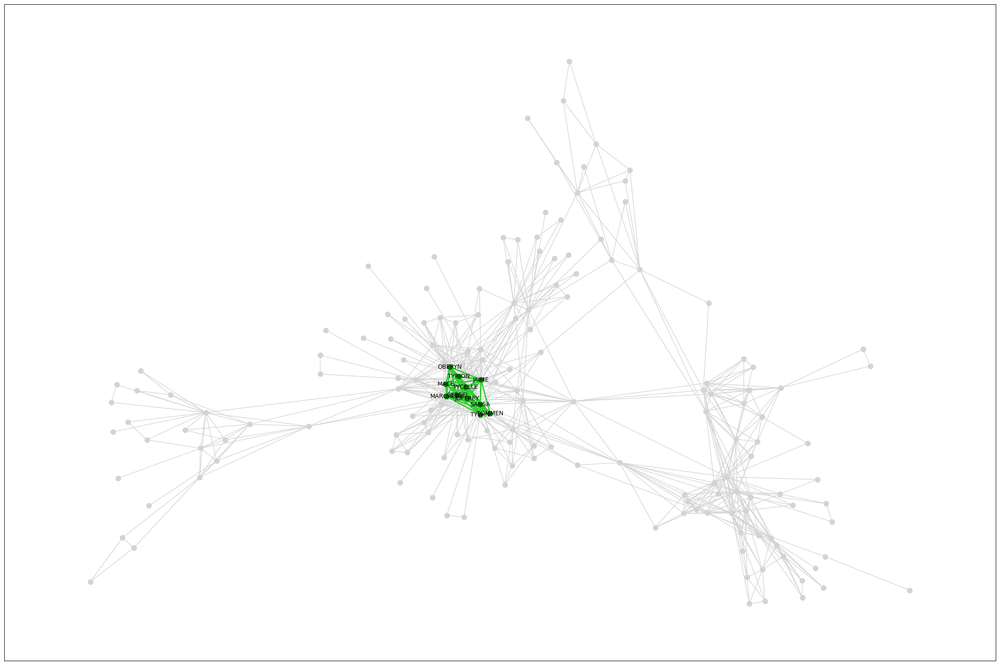

In [41]:
cliques = nx.find_cliques(G)
cliques_list = list(cliques)
#for item in cliques_list:
#  print(item)

clique = ['JOFFREY', 'TYRION', 'SANSA', 'CERSEI', 'JAIME', 'TYWIN', 'MACE', 'OBERYN', 'MARGAERY', 'TOMMEN', 'PYCELLE']


plt.figure(figsize=(30, 20))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos, node_color='LightGrey', node_size=70)
nx.draw_networkx_nodes(G, pos, nodelist=clique, node_color='Green', node_size=70)
nx.draw_networkx_edges(G, pos, edge_color='LightGrey')

# Draw edges for the clique
clique_edges = [(u, v) for u in clique for v in clique if G.has_edge(u, v)]
nx.draw_networkx_edges(G, pos, edgelist=clique_edges, edge_color='LimeGreen', width=2)
nx.draw_networkx_labels(G, pos, labels={node: node for node in clique}, font_size=10)


plt.show()


In [158]:
import networkx as nx
import matplotlib.pyplot as plt
import igraph as ig

# Define the highlighted triangles with colors
highlighted_triangles = [
    (('ARYA', 'HOUND', 'BRIENNE'), "MistyRose"),
    (('JAIME', 'TYRION', 'TYWIN'), "Red"),
    (('JAIME', 'TYRION', 'CERSEI'), "Yellow"),
    (('TYRION', 'TYWIN', 'OBERYN'), "Orange"),
    (('JAIME', 'CERSEI', 'TYWIN'), "LimeGreen"),
    (('TYRION', 'CERSEI', 'JOFFREY'), "HotPink"),
    (('CERSEI', 'JOFFREY', 'MARGAERY'), "DarkRed"),
    (('LITTLEFINGER', 'SANSA', 'LYSA'), "LightBlue"),
    (('DAENERYS', 'JORAH', 'MISSANDEI'), "Gold"),
]

# Compute positions using spring layout
community_graph_layout_gn = nx.spring_layout(G)

# Define default color for nodes and edges
default_node_color = "lightgrey"
default_edge_color = "grey"

# Initialize node colors and sizes
node_colors = [default_node_color] * len(G.nodes())
node_sizes = [70] * len(G.nodes())

# Initialize edge colors and widths
edge_colors = [default_edge_color] * len(G.edges())
edge_widths = [1] * len(G.edges())

# Convert edges to sets for efficient lookup
edges_set = set(map(frozenset, G.edges()))

# Function to compute the strength of a triangle and the maximum edge weight
def compute_triangle_strength_and_max_edge(triangle, graph):
    nodes = list(triangle)
    strength = 0
    max_edge_weight = 0
    max_edge = None
    for i in range(3):
        for j in range(i + 1, 3):
            edge = (nodes[i], nodes[j]) if (nodes[i], nodes[j]) in graph.edges() else (nodes[j], nodes[i])
            if edge in graph.edges():
                edge_weight = graph[edge[0]][edge[1]]['Weight']
                strength += edge_weight
                if edge_weight > max_edge_weight:
                    max_edge_weight = edge_weight
                    max_edge = edge
    return strength, max_edge_weight, max_edge

# Highlight the nodes and edges in the triangles and compute strengths and max edge weights
triangle_strengths_and_max_edges = []
for idx, (triangle, color) in enumerate(highlighted_triangles):
    strength, max_edge_weight, max_edge = compute_triangle_strength_and_max_edge(triangle, G)
    triangle_strengths_and_max_edges.append((triangle, strength, max_edge_weight, max_edge))

    for node in triangle:
        if node in G.nodes():
            node_index = list(G.nodes()).index(node)
            node_colors[node_index] = color  # Node color based on triangle color
            node_sizes[node_index] = 100  # Larger size for highlighted nodes

    for i in range(3):
        for j in range(i + 1, 3):
            edge = (triangle[i], triangle[j]) if (triangle[i], triangle[j]) in G.edges() else (triangle[j], triangle[i])
            if edge in G.edges():
                edge_index = list(G.edges()).index(edge)
                edge_colors[edge_index] = color  # Edge color based on triangle color
                edge_widths[edge_index] = 5  # Thicker edge for edges in triangles

# Print the strengths of the triangles, the highest edge weights, and the names of the edges
for triangle, strength, max_edge_weight, max_edge in triangle_strengths_and_max_edges:
    print(f"Triangle {triangle} has strength {strength}, the highest edge strength is {max_edge_weight}, and the strongest edge is {max_edge}")

# Add positions to igraph nodes
positions = community_graph_layout_gn
g.vs["x"] = [positions[node][0] for node in G.nodes()]
g.vs["y"] = [positions[node][1] for node in G.nodes()]

# Plot the graph with igraph
fig, ax = plt.subplots(figsize=(45, 45))
ax.set_xlim(min(g.vs["x"]) - 0.05, max(g.vs["x"]) + 0.05)
ax.set_ylim(min(g.vs["y"]) - 0.05, max(g.vs["y"]) + 0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

# Plot the graph with igraph
ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size=30,
    edge_color=edge_colors,
    edge_width=edge_widths
)

plt.show()


Output hidden; open in https://colab.research.google.com to view.

Specifically about a character

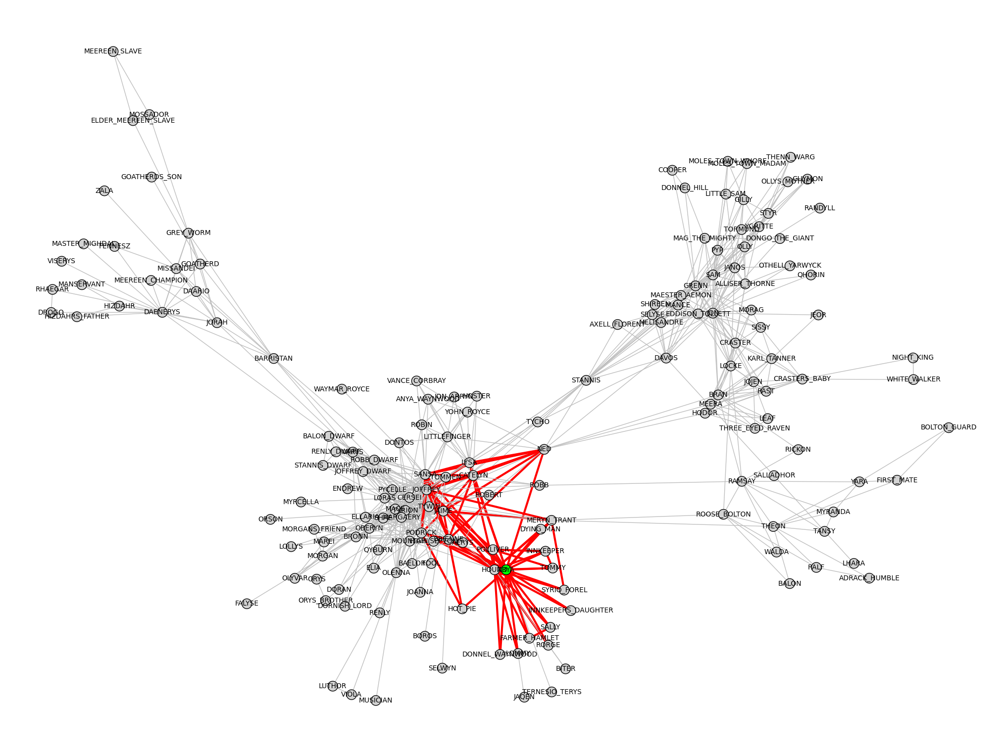

In [43]:
highlight_node = "ARYA"  # replace this with the actual node identifier

def find_triangles_with_node(G, node):
    triangles = []
    for n in G:
        neighbors = list(G.neighbors(n))
        for nbr, nbr2 in itertools.combinations(neighbors, 2):
            if G.has_edge(nbr, nbr2) and node in (n, nbr, nbr2):
                triangles.append((n, nbr, nbr2))
    return triangles

# Compute positions using spring layout
community_graph_layout_gn = nx.spring_layout(G)

# Prepare colors for nodes and edges
node_colors = []
edge_colors = []
for node in G.nodes():
    if node == highlight_node:
        node_colors.append("green")  # Highlight TYRION node
    else:
        node_colors.append("lightgrey")

# Initialize edge colors and widths
edge_colors = ["grey"] * len(G.edges())
edge_widths = [1] * len(G.edges())

# Find triangles involving TYRION
highlighted_triangles = find_triangles_with_node(G, highlight_node)

# Highlight edges in triangles involving TYRION
for triangle in highlighted_triangles:
    triangle_edges = [
        (triangle[0], triangle[1]),
        (triangle[1], triangle[2]),
        (triangle[2], triangle[0])
    ]
    for edge in triangle_edges:
        try:
            if edge in G.edges():
                edge_index = list(G.edges()).index(edge)
            elif (edge[1], edge[0]) in G.edges():
                edge_index = list(G.edges()).index((edge[1], edge[0]))
            else:
                continue  # Skip if edge not found in G.edges()

            edge_colors[edge_index] = "red"  # Color edges in triangles with red
            edge_widths[edge_index] = 3  # Thicker width for edges in triangles
        except ValueError:
            pass  # Ignore ValueError if edge not found in G.edges()

# Add positions to igraph nodes
g = ig.Graph(directed=False)
g.add_vertices(list(G.nodes()))
g.add_edges(list(G.edges()))
g.vs["x"] = [community_graph_layout_gn[node][0] for node in G.nodes()]
g.vs["y"] = [community_graph_layout_gn[node][1] for node in G.nodes()]
g.vs["Label"] = list(G.nodes())

node_sizes = [20] * len(G.nodes())

# Plot the graph with igraph
fig, ax = plt.subplots(figsize=(20, 15))
ax.set_xlim(min(g.vs["x"]) - 0.1, max(g.vs["x"]) + 0.1)
ax.set_ylim(min(g.vs["y"]) - 0.1, max(g.vs["y"]) + 0.1)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

# Plot the graph with igraph
ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in zip(g.vs["x"], g.vs["y"])],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size=10,
    edge_color=edge_colors,
    edge_width=edge_widths
)

plt.show()

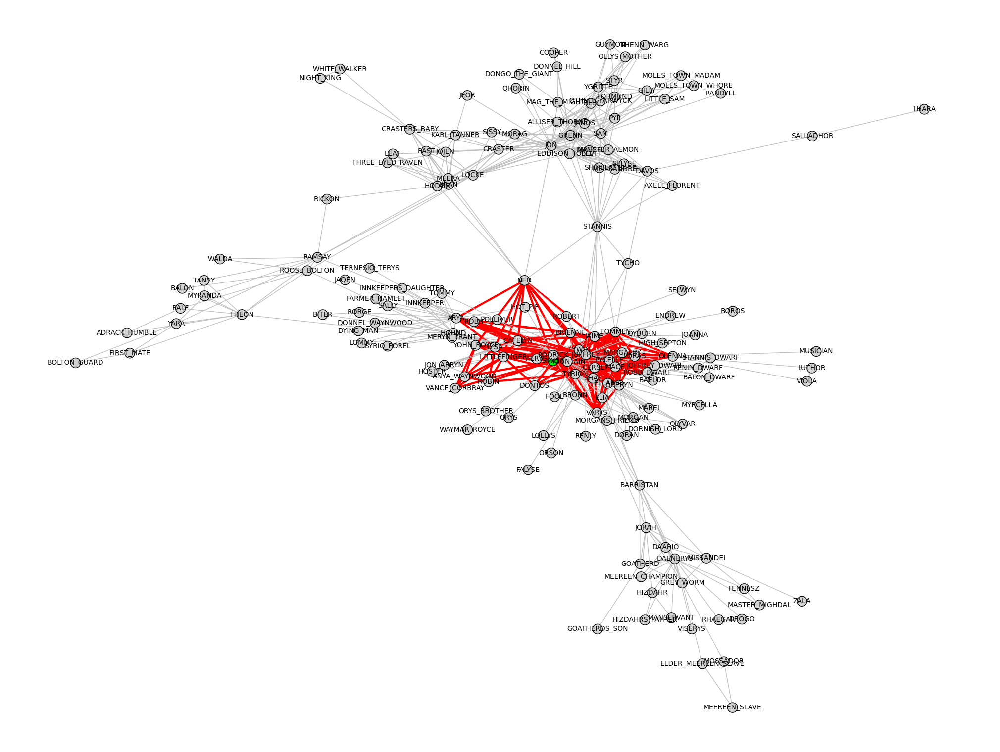

In [44]:
highlight_node = "SANSA"  # replace this with the actual node identifier

def find_triangles_with_node(G, node):
    triangles = []
    for n in G:
        neighbors = list(G.neighbors(n))
        for nbr, nbr2 in itertools.combinations(neighbors, 2):
            if G.has_edge(nbr, nbr2) and node in (n, nbr, nbr2):
                triangles.append((n, nbr, nbr2))
    return triangles

# Compute positions using spring layout
community_graph_layout_gn = nx.spring_layout(G)

# Prepare colors for nodes and edges
node_colors = []
edge_colors = []
for node in G.nodes():
    if node == highlight_node:
        node_colors.append("green")  # Highlight TYRION node
    else:
        node_colors.append("lightgrey")

# Initialize edge colors and widths
edge_colors = ["grey"] * len(G.edges())
edge_widths = [1] * len(G.edges())

# Find triangles involving TYRION
highlighted_triangles = find_triangles_with_node(G, highlight_node)

# Highlight edges in triangles involving TYRION
for triangle in highlighted_triangles:
    triangle_edges = [
        (triangle[0], triangle[1]),
        (triangle[1], triangle[2]),
        (triangle[2], triangle[0])
    ]
    for edge in triangle_edges:
        try:
            if edge in G.edges():
                edge_index = list(G.edges()).index(edge)
            elif (edge[1], edge[0]) in G.edges():
                edge_index = list(G.edges()).index((edge[1], edge[0]))
            else:
                continue  # Skip if edge not found in G.edges()

            edge_colors[edge_index] = "red"  # Color edges in triangles with red
            edge_widths[edge_index] = 3  # Thicker width for edges in triangles
        except ValueError:
            pass  # Ignore ValueError if edge not found in G.edges()

# Add positions to igraph nodes
g = ig.Graph(directed=False)
g.add_vertices(list(G.nodes()))
g.add_edges(list(G.edges()))
g.vs["x"] = [community_graph_layout_gn[node][0] for node in G.nodes()]
g.vs["y"] = [community_graph_layout_gn[node][1] for node in G.nodes()]
g.vs["Label"] = list(G.nodes())

node_sizes = [20] * len(G.nodes())

# Plot the graph with igraph
fig, ax = plt.subplots(figsize=(20, 15))
ax.set_xlim(min(g.vs["x"]) - 0.1, max(g.vs["x"]) + 0.1)
ax.set_ylim(min(g.vs["y"]) - 0.1, max(g.vs["y"]) + 0.1)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

# Plot the graph with igraph
ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in zip(g.vs["x"], g.vs["y"])],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size=10,
    edge_color=edge_colors,
    edge_width=edge_widths
)

plt.show()

### Clustering Coefficients

GENERAL INDICATION OF THE GRAPH'S TENDENCY TO BE ORGANISED INTO CLUSTERS

If a node has fewer than 2 neighbors, the clustering coefficient is undefined, and the returned value is NaN

In [45]:
# Global Clustering Coefficient (Triadic Closure) - NUMBER OF CLOSED TRIPLETS/NUMBER OF POSSIBLE TRIPLETS

print("Global clustering coefficient (Triadic Closure)", g.transitivity_undirected())

Global clustering coefficient (Triadic Closure) 0.4353452848201973


In [46]:
# Local Clustering Coefficient - ARE THE NEIGHBOURS OF THE NODES ALSO CONNECTED?
print("Local clustering components:")
local_ccs = g.transitivity_local_undirected()
sum_cc = 0
for local_cc in local_ccs:
    if not math.isnan(local_cc):
        sum_cc += local_cc

for node in nodes:
        print("   Local clustering coefficient of node", node["Label"],":",local_ccs[node.index])

Local clustering components:
   Local clustering coefficient of node Arya : 0.17753623188405795
   Local clustering coefficient of node Sandor : 0.16842105263157894
   Local clustering coefficient of node Jaime : 0.37192118226600984
   Local clustering coefficient of node Tyrion : 0.26458036984352773
   Local clustering coefficient of node Cersei : 0.3181818181818182
   Local clustering coefficient of node Daenerys : 0.2
   Local clustering coefficient of node Jorah : 0.5277777777777778
   Local clustering coefficient of node Tywin : 0.35978835978835977
   Local clustering coefficient of node Petyr : 0.43956043956043955
   Local clustering coefficient of node Sansa : 0.35053763440860214
   Local clustering coefficient of node Jon : 0.26206896551724135
   Local clustering coefficient of node Sam : 0.33
   Local clustering coefficient of node Lysa : 0.4743589743589744
   Local clustering coefficient of node Bronn : 0.49523809523809526
   Local clustering coefficient of node Podrick : 0.6

In [47]:
# Average Clustering Coefficient of the graph:

print("Average clustering component", sum_cc/len(g.vs()))


Average clustering component 0.6665100417033084


## Communities

In [48]:
# Checking Strength of Connections between characters for quick and handy insights.

def get_edge_strength(G, node1, node2):
    # Check if the edge exists
    if G.has_edge(node1, node2) or G.has_edge(node2, node1):
        # Get the weight of the edge
        edge_weight = G[node1][node2]['Weight']
        # Get the degrees of the nodes
        degree_node1 = G.degree(node1)
        degree_node2 = G.degree(node2)
        # Compute the strength of the edge as the sum of the degrees and the weight
        edge_strength = edge_weight
        return edge_strength
    else:
        return None  # Edge does not exist


node1 = "GENDRY"
node2 = "STANNIS"

edge_strength = get_edge_strength(G, node1, node2)

if edge_strength is not None:
    print(f"The strength of the edge between '{node1}' and '{node2}' is {edge_strength}.")
else:
    print(f"There is no edge between '{node1}' and '{node2}'.")

There is no edge between 'GENDRY' and 'STANNIS'.


### Infomap

In [111]:
infomap = g.community_infomap()

In [112]:
infomap_comm = infomap.membership

# Create a dictionary to hold clusters
clusters = {}

# Group nodes into clusters based on their community membership
for i, node in enumerate(G.nodes()):
    community = infomap_comm[i]
    if community not in clusters:
        clusters[community] = []
    clusters[community].append(node)

# Convert the clusters dictionary to a list of clusters
infomap_comm = [clusters[community] for community in sorted(clusters)]

n_comm_infomap = len(infomap_comm)
print("Number of communities detected:", n_comm_infomap)

Number of communities detected: 11


In [113]:
print("List of Characters by Community")
for i, cluster in enumerate(infomap_comm):
    print(f"Cluster {i+1}: {cluster}")

# Cluster 1: The Riverlands
# Cluster 2: King's Landing (Sansa during S4 is in King's Landing and then flees to the Eyrie)
# Cluster 3: Daenerys in Meereen (Cluster 9 is aggregable to Cluster 3)
# Cluster 4: Castle Black and Mole's Town (Jon and Sam) + Dragonstone (Stannis)
# Cluster 5: Winterfell
# Cluster 6: Beyond the Wall
# Cluster 7: The Eyrie
# Clusters 8-10: unrelated, although cluster 9 has 3 characters from Meereen (should be in Cluster 3)

List of Characters by Community
Cluster 1: ['ARYA', 'HOUND', 'POLLIVER', 'FARMER_HAMLET', 'TERNESIO_TERYS', 'DYING_MAN', 'SALLY', 'RORGE', 'MERYN_TRANT', 'DONNEL_WAYNWOOD', 'INNKEEPER', 'SYRIO_FOREL', 'INNKEEPERS_DAUGHTER', 'JAQEN', 'LOMMY', 'TOMMY', 'BITER']
Cluster 2: ['JAIME', 'TYRION', 'CERSEI', 'TYWIN', 'SANSA', 'BRONN', 'PODRICK', 'OBERYN', 'BRIENNE', 'SHAE', 'JOFFREY', 'ELLARIA', 'MARGAERY', 'OLENNA', 'TOMMEN', 'VARYS', 'DONTOS', 'PYCELLE', 'HOT_PIE', 'MACE', 'OLYVAR', 'QYBURN', 'MORGAN', 'MOUNTAIN', 'ELIA', 'LORAS', 'MORGANS_FRIEND', 'MAREI', 'BALON_DWARF', 'ROBB_DWARF', 'DORNISH_LORD', 'ENDREW', 'RENLY_DWARF', 'STANNIS_DWARF', 'MYRCELLA', 'JOFFREY_DWARF', 'ORSON', 'HIGH_SEPTON', 'AERYS', 'ROBERT', 'ROBB', 'BAELOR', 'SELWYN', 'LOLLYS', 'DORAN', 'RENLY', 'BOROS', 'FALYSE', 'FOOL', 'JOANNA', 'MUSICIAN', 'WAYMAR_ROYCE']
Cluster 3: ['DAENERYS', 'JORAH', 'MISSANDEI', 'DAARIO', 'GREY_WORM', 'BARRISTAN', 'HIZDAHR', 'FENNESZ', 'MEEREEN_CHAMPION', 'HIZDAHRS_FATHER', 'GOATHERD', 'MASTER_

In [114]:
#community_graph_layout_infomap = nx.spring_layout(G, k=2/np.sqrt(len(G.nodes())))
community_graph_layout_infomap = nx.spring_layout(G)
# Prepare colors for the communities
colors = ["LightCoral", "Gold", "LightGreen", "DeepSkyBlue", "Orchid", "MistyRose", "Cyan", "Orange", "Red", "DarkRed", "DarkGreen"]


node_colors = []
node_sizes = []

for node in G.nodes():
    for i, community in enumerate(infomap_comm):
        if node in community:
            node_colors.append(colors[i % len(colors)])
            node_sizes.append(70)
            break

# Add positions to igraph nodes
positions = community_graph_layout_infomap
g.vs["x"] = [positions[node][0] for node in G.nodes()]
g.vs["y"] = [positions[node][1] for node in G.nodes()]


# Plot the graph with igraph
fig, ax = plt.subplots(figsize=(45, 35))
ax.set_xlim(min(g.vs["x"])-0.05, max(g.vs["x"])+0.05)
ax.set_ylim(min(g.vs["y"])-0.05, max(g.vs["y"])+0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size = 10,
    edge_color = "grey"

)




Output hidden; open in https://colab.research.google.com to view.

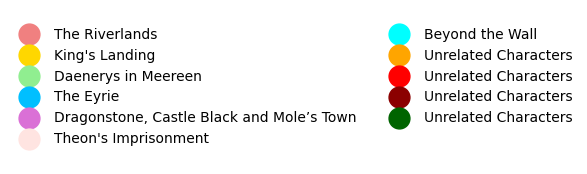

In [115]:
fig_legend, ax_legend = plt.subplots(figsize=(2,2))

# Hardcoding each legend entry
ax_legend.plot([], [], color="LightCoral", marker='o', markersize=15, linestyle='None', label="The Riverlands")
ax_legend.plot([], [], color="Gold", marker='o', markersize=15, linestyle='None', label="King's Landing")
ax_legend.plot([], [], color="LightGreen", marker='o', markersize=15, linestyle='None', label="Daenerys in Meereen")
ax_legend.plot([], [], color="DeepSkyBlue", marker='o', markersize=15, linestyle='None', label="The Eyrie")
ax_legend.plot([], [], color="Orchid", marker='o', markersize=15, linestyle='None', label="Dragonstone, Castle Black and Mole’s Town")
ax_legend.plot([], [], color="MistyRose", marker='o', markersize=15, linestyle='None', label="Theon's Imprisonment")
ax_legend.plot([], [], color="Cyan", marker='o', markersize=15, linestyle='None', label="Beyond the Wall")
ax_legend.plot([], [], color="Orange", marker='o', markersize=15, linestyle='None', label="Unrelated Characters")
ax_legend.plot([], [], color="Red", marker='o', markersize=15, linestyle='None', label="Unrelated Characters")
ax_legend.plot([], [], color="DarkRed", marker='o', markersize=15, linestyle='None', label="Unrelated Characters")
ax_legend.plot([], [], color="DarkGreen", marker='o', markersize=15, linestyle='None', label="Unrelated Characters")


ax_legend.legend(loc='center', frameon=False, ncol=2)
ax_legend.axis('off')

plt.show()

In [116]:
#modularity = np.round(g.modularity(infomap_comm), 3)
#print("The Modularity for the Infomap Method is",modularity)

modularity_infomap = round(nx.community.modularity(G, infomap_comm),3)
print("The Modularity for the Infomap Method is",modularity_infomap)

The Modularity for the Infomap Method is 0.6


### Girvan-Newman

In [117]:
#compute girvan newman communities
from networkx.algorithms import community
com_gn = community.girvan_newman(G)

# To get the communities at different levels
levels = []
desired_number_of_communities = 5 # > 5 doesn't yield any better results
for communities in com_gn:
    levels.append(communities)
    if len(communities) >= desired_number_of_communities:
        break

# The last entry in levels contains the desired number of communities
g_n_comm = [sorted(list(c)) for c in levels[-1]]
n_comm_g_n = len(g_n_comm)
print("Number of communities detected:", n_comm_g_n)
print("Communities:", g_n_comm)




Number of communities detected: 5
Communities: [['ARYA', 'BITER', 'DONNEL_WAYNWOOD', 'DYING_MAN', 'FARMER_HAMLET', 'HOUND', 'INNKEEPER', 'INNKEEPERS_DAUGHTER', 'JAQEN', 'LOMMY', 'POLLIVER', 'RORGE', 'SALLY', 'SYRIO_FOREL', 'TERNESIO_TERYS', 'TOMMY'], ['AERYS', 'ANYA_WAYNWOOD', 'BAELOR', 'BALON_DWARF', 'BOROS', 'BRIENNE', 'BRONN', 'CATELYN', 'CERSEI', 'DONTOS', 'DORAN', 'DORNISH_LORD', 'ELIA', 'ELLARIA', 'ENDREW', 'FALYSE', 'FOOL', 'HIGH_SEPTON', 'HOSTER', 'HOT_PIE', 'JAIME', 'JOANNA', 'JOFFREY', 'JOFFREY_DWARF', 'JON_ARRYN', 'LITTLEFINGER', 'LOLLYS', 'LORAS', 'LUTHOR', 'LYSA', 'MACE', 'MAREI', 'MARGAERY', 'MERYN_TRANT', 'MORGAN', 'MORGANS_FRIEND', 'MOUNTAIN', 'MUSICIAN', 'MYRCELLA', 'NED', 'OBERYN', 'OLENNA', 'OLYVAR', 'ORSON', 'ORYS', 'ORYS_BROTHER', 'PODRICK', 'PYCELLE', 'QYBURN', 'RENLY', 'RENLY_DWARF', 'ROBB', 'ROBB_DWARF', 'ROBERT', 'ROBIN', 'SANSA', 'SELWYN', 'SHAE', 'STANNIS_DWARF', 'TOMMEN', 'TYRION', 'TYWIN', 'VANCE_CORBRAY', 'VARYS', 'VIOLA', 'WAYMAR_ROYCE', 'YOHN_ROYCE'], ['

In [118]:
# Print each community list
print("List of the characters, divided per communities:")
for idx, community in enumerate(g_n_comm):
    print(f"Cluster {idx + 1}: {community}")

List of the characters, divided per communities:
Cluster 1: ['ARYA', 'BITER', 'DONNEL_WAYNWOOD', 'DYING_MAN', 'FARMER_HAMLET', 'HOUND', 'INNKEEPER', 'INNKEEPERS_DAUGHTER', 'JAQEN', 'LOMMY', 'POLLIVER', 'RORGE', 'SALLY', 'SYRIO_FOREL', 'TERNESIO_TERYS', 'TOMMY']
Cluster 2: ['AERYS', 'ANYA_WAYNWOOD', 'BAELOR', 'BALON_DWARF', 'BOROS', 'BRIENNE', 'BRONN', 'CATELYN', 'CERSEI', 'DONTOS', 'DORAN', 'DORNISH_LORD', 'ELIA', 'ELLARIA', 'ENDREW', 'FALYSE', 'FOOL', 'HIGH_SEPTON', 'HOSTER', 'HOT_PIE', 'JAIME', 'JOANNA', 'JOFFREY', 'JOFFREY_DWARF', 'JON_ARRYN', 'LITTLEFINGER', 'LOLLYS', 'LORAS', 'LUTHOR', 'LYSA', 'MACE', 'MAREI', 'MARGAERY', 'MERYN_TRANT', 'MORGAN', 'MORGANS_FRIEND', 'MOUNTAIN', 'MUSICIAN', 'MYRCELLA', 'NED', 'OBERYN', 'OLENNA', 'OLYVAR', 'ORSON', 'ORYS', 'ORYS_BROTHER', 'PODRICK', 'PYCELLE', 'QYBURN', 'RENLY', 'RENLY_DWARF', 'ROBB', 'ROBB_DWARF', 'ROBERT', 'ROBIN', 'SANSA', 'SELWYN', 'SHAE', 'STANNIS_DWARF', 'TOMMEN', 'TYRION', 'TYWIN', 'VANCE_CORBRAY', 'VARYS', 'VIOLA', 'WAYMAR_ROY

In [119]:
community_graph_layout_gn = nx.spring_layout(G)
# Prepare colors for the communities
colors = ["LightCoral", "Gold", "LightGreen", "DeepSkyBlue", "Orchid", "LightSalmon", "Cyan"]
node_colors = []
node_sizes = []

for node in G.nodes():
    for i, community in enumerate(g_n_comm):
        if node in community:
            node_colors.append(colors[i % len(colors)])
            node_sizes.append(70)
            break

# Add positions to igraph nodes
positions = community_graph_layout_gn
g.vs["x"] = [positions[node][0] for node in G.nodes()]
g.vs["y"] = [positions[node][1] for node in G.nodes()]


# Plot the graph with igraph
fig, ax = plt.subplots(figsize=(45, 35))
ax.set_xlim(min(g.vs["x"])-0.05, max(g.vs["x"])+0.05)
ax.set_ylim(min(g.vs["y"])-0.05, max(g.vs["y"])+0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size = 10,
    edge_color = "grey"

)


Output hidden; open in https://colab.research.google.com to view.

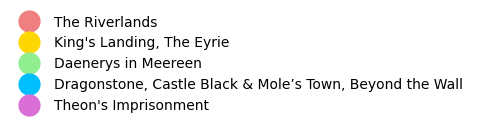

In [120]:
fig_legend, ax_legend = plt.subplots(figsize=(2,1))

# Hardcoding each legend entry
ax_legend.plot([], [], color="LightCoral", marker='o', markersize=15, linestyle='None', label="The Riverlands")
ax_legend.plot([], [], color="Gold", marker='o', markersize=15, linestyle='None', label="King's Landing, The Eyrie")
ax_legend.plot([], [], color="LightGreen", marker='o', markersize=15, linestyle='None', label="Daenerys in Meereen")
ax_legend.plot([], [], color="DeepSkyBlue", marker='o', markersize=15, linestyle='None', label="Dragonstone, Castle Black & Mole’s Town, Beyond the Wall")
ax_legend.plot([], [], color="Orchid", marker='o', markersize=15, linestyle='None', label="Theon's Imprisonment")

ax_legend.legend(loc='center', frameon=False, ncol=1)
ax_legend.axis('off')

plt.show()

In [121]:
def convertInLabelArray_communities(G, list_of_communities):
    # Initialize the label array with a default value that indicates no community found
    d = []
    num_communities = len(list_of_communities)

    # Create a dictionary to map each node to its community label
    node_to_community = {}
    for community_label, community in enumerate(list_of_communities):
        for node in community:
            node_to_community[node] = community_label

    # Populate the label array based on the node's community
    for node in G.nodes():
        if node in node_to_community:
            d.append(node_to_community[node])
        else:
            d.append(num_communities)  # Assign a label for nodes not in any community

    d = np.array(d)
    return d

In [122]:
#modularity
#modularity = np.round(get_modularity(nx.to_numpy_array(G, weight=None), convertInLabelArray_communities(G, next(com))), 3)

modularity_g_n = round(nx.community.modularity(G, next(com_gn)),3)

print("The Modularity for the Girvan-Newman Nethod is", modularity_g_n)

The Modularity for the Girvan-Newman Nethod is 0.573


### Louvain

In [123]:
louvain_comm = nx.community.louvain_communities(G, seed=123)
n_comm_louvain = len(louvain_comm)
print("Number of communities detected:", n_comm_louvain)

Number of communities detected: 7


In [124]:
# Convert communities to lists and print each one
print("List of the characters, divided per communities:")
for idx, community in enumerate(louvain_comm):
    print(f"Community {idx + 1}: {community}")

List of the characters, divided per communities:
Community 1: {'FARMER_HAMLET', 'POLLIVER', 'INNKEEPER', 'JAQEN', 'SALLY', 'RORGE', 'BITER', 'DYING_MAN', 'DONNEL_WAYNWOOD', 'SYRIO_FOREL', 'TERNESIO_TERYS', 'MERYN_TRANT', 'HOUND', 'INNKEEPERS_DAUGHTER', 'ARYA', 'TOMMY', 'LOMMY'}
Community 2: {'TANSY', 'BOLTON_GUARD', 'RALF', 'ROOSE_BOLTON', 'WALDA', 'RAMSAY', 'YARA', 'RICKON', 'MYRANDA', 'ADRACK_HUMBLE', 'BALON', 'THEON', 'FIRST_MATE'}
Community 3: {'KARL_TANNER', 'WHITE_WALKER', 'THREE_EYED_RAVEN', 'RAST', 'JOJEN', 'HODOR', 'CRASTER', 'MEERA', 'JEOR', 'BRAN', 'LEAF', 'CRASTERS_BABY', 'NIGHT_KING'}
Community 4: {'OLLY', 'SHIREEN', 'SISSY', 'LITTLE_SAM', 'ALLISER_THORNE', 'STANNIS', 'TYCHO', 'GUYMON', 'MELISANDRE', 'JON', 'MAG_THE_MIGHTY', 'RANDYLL', 'DAVOS', 'TORMUND', 'MOLES_TOWN_WHORE', 'GRENN', 'AXELL_FLORENT', 'YGRITTE', 'DONNEL_HILL', 'DONGO_THE_GIANT', 'OTHELL_YARWYCK', 'STYR', 'SELYSE', 'SAM', 'THENN_WARG', 'MOLES_TOWN_MADAM', 'PYP', 'MANCE', 'OLLYS_MOTHER', 'EDDISON_TOLLETT', 'L

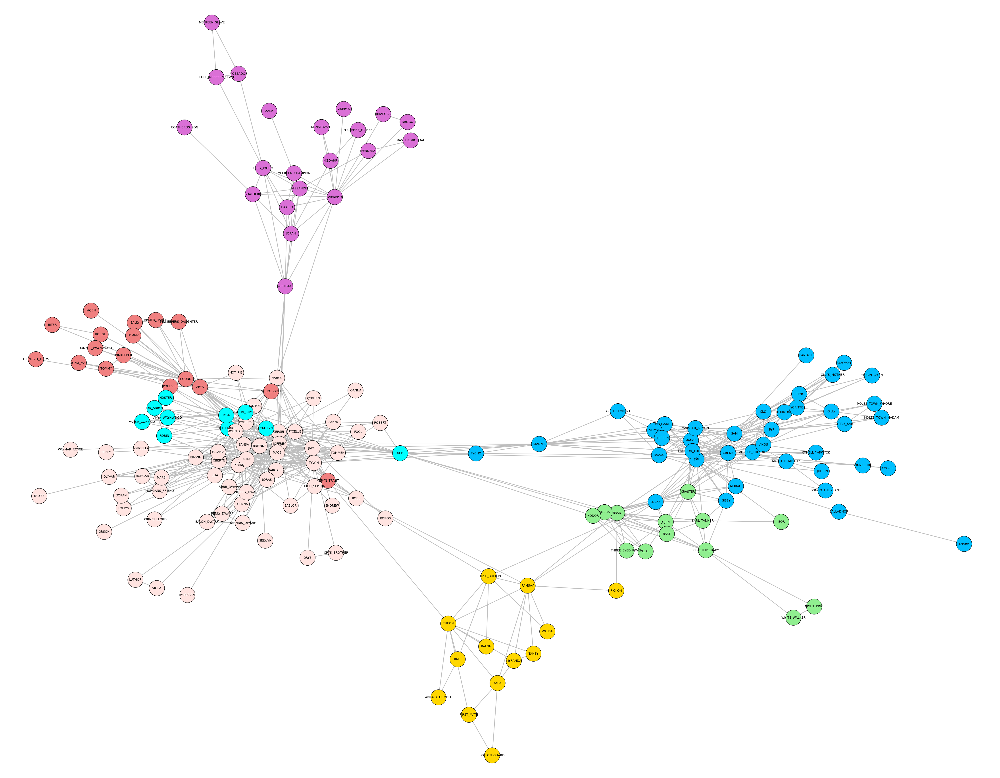

In [125]:
community_graph_layout_louvain = nx.spring_layout(G)
# Prepare colors for the communities
colors = ["LightCoral", "Gold", "LightGreen", "DeepSkyBlue", "Orchid", "MistyRose", "Cyan"]
node_colors = []
node_sizes = []

for node in G.nodes():
    for i, community in enumerate(louvain_comm):
        if node in community:
            node_colors.append(colors[i % len(colors)])
            node_sizes.append(70)
            break

# Add positions to igraph nodes
positions = community_graph_layout_louvain
g.vs["x"] = [positions[node][0] for node in G.nodes()]
g.vs["y"] = [positions[node][1] for node in G.nodes()]


# Plot the graph with igraph
fig, ax = plt.subplots(figsize=(45, 35))
ax.set_xlim(min(g.vs["x"])-0.05, max(g.vs["x"])+0.05)
ax.set_ylim(min(g.vs["y"])-0.05, max(g.vs["y"])+0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size = 10,
    edge_color = "grey"

)


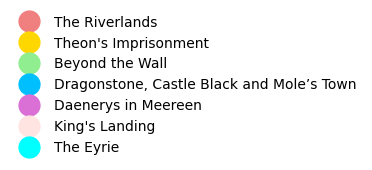

In [126]:
fig_legend, ax_legend = plt.subplots(figsize=(2,1))

# Hardcoding each legend entry
ax_legend.plot([], [], color="LightCoral", marker='o', markersize=15, linestyle='None', label="The Riverlands")
ax_legend.plot([], [], color="Gold", marker='o', markersize=15, linestyle='None', label="Theon's Imprisonment")
ax_legend.plot([], [], color="LightGreen", marker='o', markersize=15, linestyle='None', label="Beyond the Wall")
ax_legend.plot([], [], color="DeepSkyBlue", marker='o', markersize=15, linestyle='None', label="Dragonstone, Castle Black and Mole’s Town")
ax_legend.plot([], [], color="Orchid", marker='o', markersize=15, linestyle='None', label="Daenerys in Meereen")
ax_legend.plot([], [], color="MistyRose", marker='o', markersize=15, linestyle='None', label="King's Landing")
ax_legend.plot([], [], color="Cyan", marker='o', markersize=15, linestyle='None', label="The Eyrie")


ax_legend.legend(loc='center', frameon=False, ncol=1)
ax_legend.axis('off')

plt.show()

In [127]:
modularity_louvain = round(nx.community.modularity(G, louvain_comm),3)
print("The Modularity for the Louvain Method is",modularity_louvain)

The Modularity for the Louvain Method is 0.6


### Greedy Modularity Maximization

In [128]:
gmm_comm = nx.community.greedy_modularity_communities(G)
n_comm_gmm = len(gmm_comm)
print("The number of communities detected are:",n_comm_gmm)

The number of communities detected are: 4


In [129]:
print("List of the characters, divided per communities:")
for idx, community in enumerate(gmm_comm):
    print(f"Cluster {idx + 1}: {community}")

List of the characters, divided per communities:
Cluster 1: frozenset({'DORNISH_LORD', 'VIOLA', 'POLLIVER', 'AERYS', 'RORGE', 'OLYVAR', 'TERNESIO_TERYS', 'ANYA_WAYNWOOD', 'DONTOS', 'HIGH_SEPTON', 'CERSEI', 'ELLARIA', 'CATELYN', 'HOUND', 'ORYS_BROTHER', 'ROBB_DWARF', 'TOMMY', 'MARGAERY', 'ELIA', 'MORGAN', 'ORYS', 'MACE', 'BRIENNE', 'INNKEEPER', 'TYRION', 'LOLLYS', 'MOUNTAIN', 'DYING_MAN', 'SELWYN', 'SYRIO_FOREL', 'BOROS', 'ROBB', 'LITTLEFINGER', 'SHAE', 'RENLY_DWARF', 'JAIME', 'MORGANS_FRIEND', 'BAELOR', 'JOFFREY', 'YOHN_ROYCE', 'WAYMAR_ROYCE', 'LOMMY', 'MUSICIAN', 'ORSON', 'ROBERT', 'FARMER_HAMLET', 'DORAN', 'HOT_PIE', 'SALLY', 'NED', 'JOANNA', 'DONNEL_WAYNWOOD', 'VANCE_CORBRAY', 'MYRCELLA', 'PYCELLE', 'OLENNA', 'BRONN', 'HOSTER', 'INNKEEPERS_DAUGHTER', 'RENLY', 'ARYA', 'BALON_DWARF', 'SANSA', 'TOMMEN', 'OBERYN', 'FOOL', 'LORAS', 'ENDREW', 'FALYSE', 'PODRICK', 'JAQEN', 'TYWIN', 'JOFFREY_DWARF', 'BITER', 'VARYS', 'ROBIN', 'JON_ARRYN', 'LYSA', 'LUTHOR', 'MAREI', 'QYBURN', 'STANNIS_DWARF'

In [130]:
community_graph_layout_gmm = nx.spring_layout(G)
# Prepare colors for the communities
colors = ["LightCoral", "Gold", "LightGreen", "DeepSkyBlue", "Orchid", "MistyRose", "Cyan"]
node_colors = []
node_sizes = []

for node in G.nodes():
    for i, community in enumerate(gmm_comm):
        if node in community:
            node_colors.append(colors[i % len(colors)])
            node_sizes.append(70)
            break

# Add positions to igraph nodes
positions = community_graph_layout_gmm
g.vs["x"] = [positions[node][0] for node in G.nodes()]
g.vs["y"] = [positions[node][1] for node in G.nodes()]


# Plot the graph with igraph
fig, ax = plt.subplots(figsize=(45, 35))
ax.set_xlim(min(g.vs["x"])-0.05, max(g.vs["x"])+0.05)
ax.set_ylim(min(g.vs["y"])-0.05, max(g.vs["y"])+0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size = 10,
    edge_color = "grey"

)


Output hidden; open in https://colab.research.google.com to view.

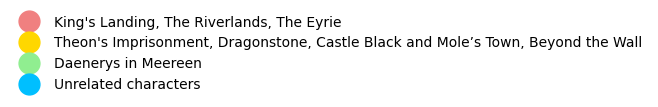

In [131]:
fig_legend, ax_legend = plt.subplots(figsize=(2,1))

# Hardcoding each legend entry
ax_legend.plot([], [], color="LightCoral", marker='o', markersize=15, linestyle='None', label="King's Landing, The Riverlands, The Eyrie")
ax_legend.plot([], [], color="Gold", marker='o', markersize=15, linestyle='None', label="Theon's Imprisonment, Dragonstone, Castle Black and Mole’s Town, Beyond the Wall")
ax_legend.plot([], [], color="LightGreen", marker='o', markersize=15, linestyle='None', label="Daenerys in Meereen")
ax_legend.plot([], [], color="DeepSkyBlue", marker='o', markersize=15, linestyle='None', label="Unrelated characters")

ax_legend.legend(loc='center', frameon=False, ncol=1)
ax_legend.axis('off')

plt.show()

In [132]:
modularity_gmm = round(nx.community.modularity(G, gmm_comm),3)
print("The modularity for Greedy Modularity Maximization is", modularity_gmm)

The modularity for Greedy Modularity Maximization is 0.514


### Spectral Clustering

In [133]:
adj_matrix = nx.to_numpy_array(G)

num_clusters = 8  # Specify the number of communities
spectral_clustering = SpectralClustering(n_clusters=num_clusters, affinity='precomputed', random_state=30)
labels = spectral_clustering.fit_predict(adj_matrix)

community_dict = {node: labels[i] for i, node in enumerate(G.nodes())}
sc_comm = [[] for _ in range(num_clusters)]
for node, comm in community_dict.items():
  sc_comm[comm].append(node)

n_comm_sc = len(sc_comm)

print(f"Spectral Clustering detected {n_comm_sc} communities")
print("List of the characters, divided per communities:")
for idx, community in enumerate(sc_comm):
    print(f"Cluster {idx + 1}: {community}")

Spectral Clustering detected 8 communities
List of the characters, divided per communities:
Cluster 1: ['ARYA', 'HOUND', 'POLLIVER', 'FARMER_HAMLET', 'TERNESIO_TERYS', 'DYING_MAN', 'SALLY', 'RORGE', 'DONNEL_WAYNWOOD', 'INNKEEPER', 'SYRIO_FOREL', 'INNKEEPERS_DAUGHTER', 'JAQEN', 'LOMMY', 'TOMMY', 'BITER']
Cluster 2: ['JAIME', 'TYRION', 'CERSEI', 'TYWIN', 'LITTLEFINGER', 'SANSA', 'LYSA', 'BRONN', 'PODRICK', 'OBERYN', 'BRIENNE', 'SHAE', 'JOFFREY', 'ELLARIA', 'MARGAERY', 'OLENNA', 'ROBIN', 'TOMMEN', 'VARYS', 'DONTOS', 'YOHN_ROYCE', 'PYCELLE', 'HOT_PIE', 'ANYA_WAYNWOOD', 'MACE', 'OLYVAR', 'QYBURN', 'TYCHO', 'MORGAN', 'MOUNTAIN', 'ELIA', 'LORAS', 'CATELYN', 'MORGANS_FRIEND', 'MAREI', 'BALON_DWARF', 'ROBB_DWARF', 'DORNISH_LORD', 'ENDREW', 'NED', 'RENLY_DWARF', 'STANNIS_DWARF', 'MYRCELLA', 'JOFFREY_DWARF', 'JON_ARRYN', 'MERYN_TRANT', 'ORSON', 'HIGH_SEPTON', 'LUTHOR', 'AERYS', 'ROBERT', 'ROBB', 'BAELOR', 'SELWYN', 'LOLLYS', 'HOSTER', 'DORAN', 'RENLY', 'VANCE_CORBRAY', 'BOROS', 'FALYSE', 'FOOL', 

In [134]:
import networkx as nx
import numpy as np
from sklearn.cluster import SpectralClustering
import igraph as ig
import matplotlib.pyplot as plt

community_graph_layout = nx.spring_layout(G)

# Prepare colors for the communities
colors = ["LightCoral", "Gold", "LightGreen", "DeepSkyBlue", "Orchid", "MistyRose", "Cyan"]
node_colors = []
node_sizes = []

for node in G.nodes():
    for i, community in enumerate(sc_comm):
        if node in community:
            node_colors.append(colors[i % len(colors)])
            node_sizes.append(70)
            break

ig_G = ig.Graph.Weighted_Adjacency(adj_matrix.tolist(), mode=ig.ADJ_UNDIRECTED)
ig_G.vs["Label"] = list(G.nodes())

# Add positions to igraph nodes
positions = community_graph_layout
ig_G.vs["x"] = [positions[node][0] for node in G.nodes()]
ig_G.vs["y"] = [positions[node][1] for node in G.nodes()]

# Plot the graph with igraph
fig, ax = plt.subplots(figsize=(45, 35))
ax.set_xlim(min(ig_G.vs["x"])-0.05, max(ig_G.vs["x"])+0.05)
ax.set_ylim(min(ig_G.vs["y"])-0.05, max(ig_G.vs["y"])+0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

ig.plot(
    ig_G,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=ig_G.vs["Label"],
    vertex_label_size=10,
    edge_color="grey",
    edge_width=[weight * 2 for weight in ig_G.es['weight']]
)
plt.show()



Output hidden; open in https://colab.research.google.com to view.

In [156]:
modularity_sc = round(nx.community.modularity(G, sc_comm),3)
print("The modularity for Spectral Clustering is", modularity_sc)

The modularity for Spectral Clustering is 0.581


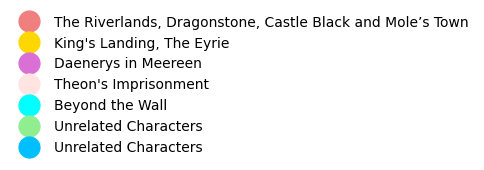

In [136]:
fig_legend, ax_legend = plt.subplots(figsize=(2,1))

# Hardcoding each legend entry
ax_legend.plot([], [], color="LightCoral", marker='o', markersize=15, linestyle='None', label="The Riverlands, Dragonstone, Castle Black and Mole’s Town")
ax_legend.plot([], [], color="Gold", marker='o', markersize=15, linestyle='None', label="King's Landing, The Eyrie")
ax_legend.plot([], [], color="Orchid", marker='o', markersize=15, linestyle='None', label="Daenerys in Meereen")
ax_legend.plot([], [], color="MistyRose", marker='o', markersize=15, linestyle='None', label="Theon's Imprisonment")
ax_legend.plot([], [], color="Cyan", marker='o', markersize=15, linestyle='None', label="Beyond the Wall")
ax_legend.plot([], [], color="LightGreen", marker='o', markersize=15, linestyle='None', label="Unrelated Characters")
ax_legend.plot([], [], color="DeepSkyBlue", marker='o', markersize=15, linestyle='None', label="Unrelated Characters")

ax_legend.legend(loc='center', frameon=False, ncol=1)
ax_legend.axis('off')

plt.show()

### Mixed-Membership Stochastic Block Model

### Multiple Comms


### Single Comm

Iteration 0 completed
Iteration 10 completed
Iteration 20 completed
Iteration 30 completed
Iteration 40 completed
Iteration 50 completed
Iteration 60 completed
Iteration 70 completed
Iteration 80 completed
Iteration 90 completed


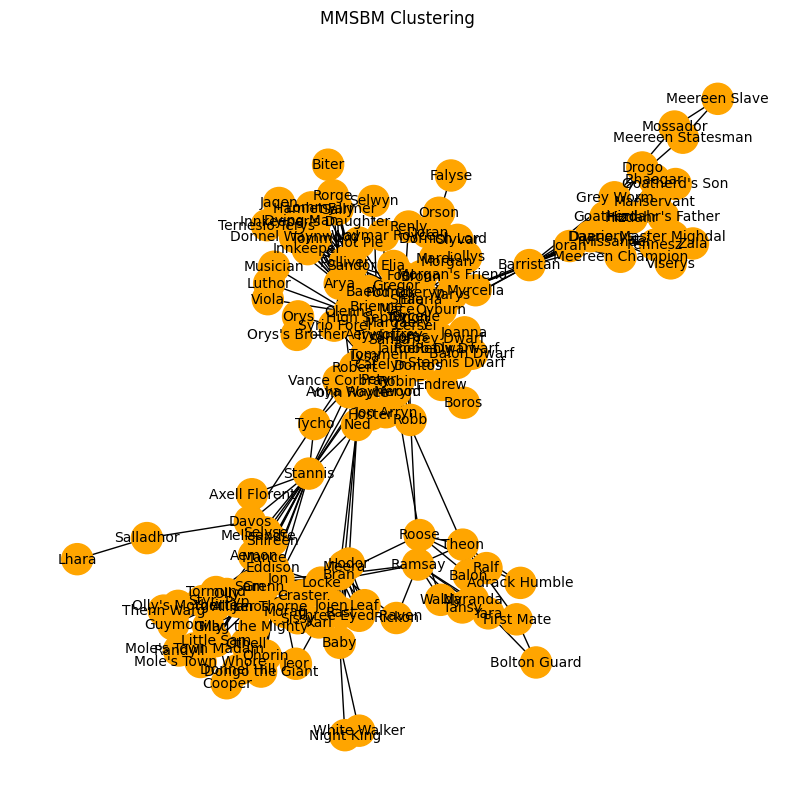

In [137]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd

class MMSBM:
    def __init__(self, alpha, nVertices, bernouilli_matrix, sparsity_param=0.):
        self.alpha = alpha
        self.K = len(self.alpha)
        self.nVertices = nVertices
        self.bernMat = bernouilli_matrix
        self.rho = sparsity_param

        # Validate Bernoulli matrix
        if self.bernMat.shape != (self.K, self.K):
            raise ValueError("bernouilli_matrix must be of shape K x K")

        self.vertices = np.zeros((nVertices, self.K))
        self.adjacencyMat = np.zeros((nVertices, nVertices))
        self.trueClusters = np.zeros(self.nVertices, dtype=np.int8)

    def getDegreesMatrix(self):
        diag = np.sum(self.adjacencyMat, axis=1)
        return np.diag(diag)

    def fit(self, G, n_iter=100):
        # Initialize node memberships with a Dirichlet distribution
        self.vertices = np.random.dirichlet(self.alpha, self.nVertices)
        self.adjacencyMat = nx.to_numpy_array(G)

        for it in range(n_iter):
            # Update memberships
            for i in range(self.nVertices):
                for k in range(self.K):
                    self.vertices[i, k] = self.alpha[k] + np.sum(
                        [self.bernMat[k, l] * np.sum(self.vertices[:, l] * self.adjacencyMat[i, :]) for l in range(self.K)]
                    )
            self.vertices = self.vertices / self.vertices.sum(axis=1, keepdims=True)

            if it % 10 == 0:
                print(f"Iteration {it} completed")

    def cluster(self, labels, colorClusters=['pink','cyan','orange','green','purple','brown', "red", "blue"]):
        color_map = []
        for i in range(self.nVertices):
            self.trueClusters[i] = int(np.argmax(self.vertices[i,:]))
            color_map.append(colorClusters[self.trueClusters[i]])

        # Draw graph with detected clusters
        plt.figure(figsize=(10, 10))
        plt.title('MMSBM Clustering')
        pos = nx.spring_layout(G)  # Position the nodes using the spring layout
        nx.draw(G, pos, node_color=color_map, with_labels=True, labels=labels, node_size=500, font_size=10, font_color='black')
        plt.show()



# Remove duplicates based on Id (keeping the first occurrence)
characters_df = characters_df.drop_duplicates(subset='Id')

# Create the NetworkX graph from the edge list
G = nx.from_pandas_edgelist(relations_df, 'Source', 'Target', ['Weight'])

# Convert characters DataFrame to dictionary and add nodes with attributes
characters = characters_df.set_index('Id').to_dict('index')
nx.set_node_attributes(G, characters)

# Parameters for the MMSBM
alpha = np.array([0.5, 0.2, 0.4, 0.8])  # Dirichlet parameter for three communities
K = len(alpha)  # Number of communities
bernMat = np.random.rand(K, K)  # Random Bernoulli matrix for simplicity

# Initialize the MMSBM model
model = MMSBM(alpha, G.number_of_nodes(), bernMat)

# Fit the model
model.fit(G, n_iter=100)

# Extract node labels
labels = {node: characters[node]['Label'] for node in G.nodes()}

# Cluster the nodes and visualize the results
model.cluster(labels)


In [138]:
class MMSBM:
    def __init__(self, alpha, adj_matrix, sparsity_param=0.5):
        self.alpha = alpha
        self.K = len(self.alpha)
        self.adjacencyMat = adj_matrix
        self.nVertices = adj_matrix.shape[0]
        self.rho = sparsity_param

        self.vertices = np.zeros((self.nVertices, self.K))
        self.trueClusters = np.zeros(self.nVertices, dtype=np.int8)
        self.kmeansClusters = np.zeros(self.nVertices, dtype=np.int8)

    def simulateVertices(self):
        # Sample vertex profiles
        for i in range(self.nVertices):
            self.vertices[i,:] = np.random.dirichlet(self.alpha)
        # Sort vertices by highest value
        self.vertices = np.array(sorted(self.vertices, key=lambda x: np.argmax(x)))

    def showGraph(self):
        plt.figure(figsize=(13,6))
        # Drawing adjacency matrix
        plt.subplot(131)
        matPlot = np.zeros((self.nVertices, self.nVertices, 3))
        matPlot[self.adjacencyMat==0,:] = np.array([255,255,255])
        matPlot[self.adjacencyMat!=0,:] = np.array([0, 153, 255])
        plt.imshow(matPlot)
        plt.title("adjacency matrix")
        # Drawing vertices
        plt.subplot(132)
        plt.imshow(self.vertices, cmap='Reds')
        plt.title("vertices profile")
        plt.colorbar()
        # Drawing graph
        G = nx.Graph()
        G.add_nodes_from(list(range(self.nVertices)))
        for i in range(self.nVertices):
            for j in range(i, self.nVertices):
                if self.adjacencyMat[i,j] != 0:
                    G.add_edge(i,j)
        plt.subplot(133)
        plt.title('graph')
        nx.draw(G, with_labels=True)
        plt.show()

    def groundTruthClustering(self, colorClusters=['pink','cyan','orange','green','purple','brown']):
        color_map = []
        for i in range(self.nVertices):
            self.trueClusters[i] = int(np.argmax(self.vertices[i,:]))
            color_map.append(colorClusters[self.trueClusters[i]])

        # Draw graph with ground truth clusters
        G = nx.Graph()
        G.add_nodes_from(list(range(self.nVertices)))
        for i in range(self.nVertices):
            for j in range(i, self.nVertices):
                if self.adjacencyMat[i,j] != 0:
                    G.add_edge(i,j)
        plt.title('ground truth clustering')
        nx.draw(G, node_color=color_map, with_labels=True)
        plt.show()

    def getDegreesMatrix(self):
        diag = []
        for i in range(self.nVertices):
            diag.append(np.sum(self.adjacencyMat[i,:]))
        return np.diag(diag)

    def fit(self, max_iter=100):
        # Placeholder fit method, actual implementation should estimate model parameters
        pass

    def get_memberships(self):
        return self.vertices


adj_matrix = nx.to_numpy_array(G, weight='Weight')
alpha = [0.2] * 5  # Prior for Dirichlet distribution

model = MMSBM(alpha, adj_matrix)
model.fit()
memberships = model.get_memberships()

# Assign communities based on maximum membership probability
communities = [np.argmax(membership) for membership in memberships]


# Group nodes by communities using node labels
community_dict = {}
node_labels = list(G.nodes())
for node, community in zip(node_labels, communities):
    if community not in community_dict:
        community_dict[community] = []
    community_dict[community].append(node)

# Print the number of communities and list the members
n_communities = len(community_dict)
print("The number of communities detected are:", n_communities)
print("List of the characters, divided per communities:")
for idx, (community, members) in enumerate(community_dict.items()):
    print(f"Cluster {idx + 1}: {members}")


# Draw the clustered graph
community_graph_layout = nx.spring_layout(G)
# Prepare colors for the communities
colors = ["LightCoral", "Gold", "LightGreen", "DeepSkyBlue", "Orchid", "MistyRose", "Cyan"]
node_colors = [colors[community % len(colors)] for community in communities]
node_sizes = [70] * len(G.nodes())

# Add positions to igraph nodes
positions = community_graph_layout
g = ig.Graph.from_networkx(G)
g.vs["x"] = [positions[node][0] for node in G.nodes()]
g.vs["y"] = [positions[node][1] for node in G.nodes()]
g.vs["Label"] = list(G.nodes())

# Plot the graph with igraph
fig, ax = plt.subplots(figsize=(45, 35))
ax.set_xlim(min(g.vs["x"])-0.05, max(g.vs["x"])+0.05)
ax.set_ylim(min(g.vs["y"])-0.05, max(g.vs["y"])+0.05)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('auto')
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
ig.plot(
    g,
    target=ax,
    layout=[(pos[0], pos[1]) for pos in positions.values()],
    vertex_color=node_colors,
    vertex_size=node_sizes,
    vertex_label=g.vs["Label"],
    vertex_label_size=10,
    edge_color="grey"
)
plt.show()

model.showGraph()
model.groundTruthClustering()

Output hidden; open in https://colab.research.google.com to view.

### Original Working

### Comparison

In [139]:
community_methods =[]
community_methods.append("Infomap")
community_methods.append("Louvain")
community_methods.append("Girvan-Newmann")
community_methods.append("Greedy M.M.")
community_methods.append("Spectral Clustering")

methods_modularity = []
methods_modularity.append(modularity_infomap)
methods_modularity.append(modularity_louvain)
methods_modularity.append(modularity_g_n)
methods_modularity.append(modularity_gmm)
methods_modularity.append(modularity_sc)

n_communities = []
n_communities.append(n_comm_infomap)
n_communities.append(n_comm_louvain)
n_communities.append(n_comm_g_n)
n_communities.append(n_comm_gmm)
n_communities.append(n_comm_sc)

print("Comparison between Methods: Number of Communities and Modularity")
print(f"Infomap: {n_communities[0]}  -  {methods_modularity[0]}")
print(f"Louvain: {n_communities[1]}  -  {methods_modularity[1]}")
print(f"Girvan-Newman: {n_communities[2]}  -  {methods_modularity[2]}")
print(f"Greedy Modularity Maximization: {n_communities[3]}  -  {methods_modularity[3]}")
print(f"Spectral Clustring: {n_communities[4]}  -  {methods_modularity[4]}")

Comparison between Methods: Number of Communities and Modularity
Infomap: 11  -  0.6
Louvain: 7  -  0.6
Girvan-Newman: 5  -  0.573
Greedy Modularity Maximization: 4  -  0.514
Spectral Clustring: 8  -  0.581


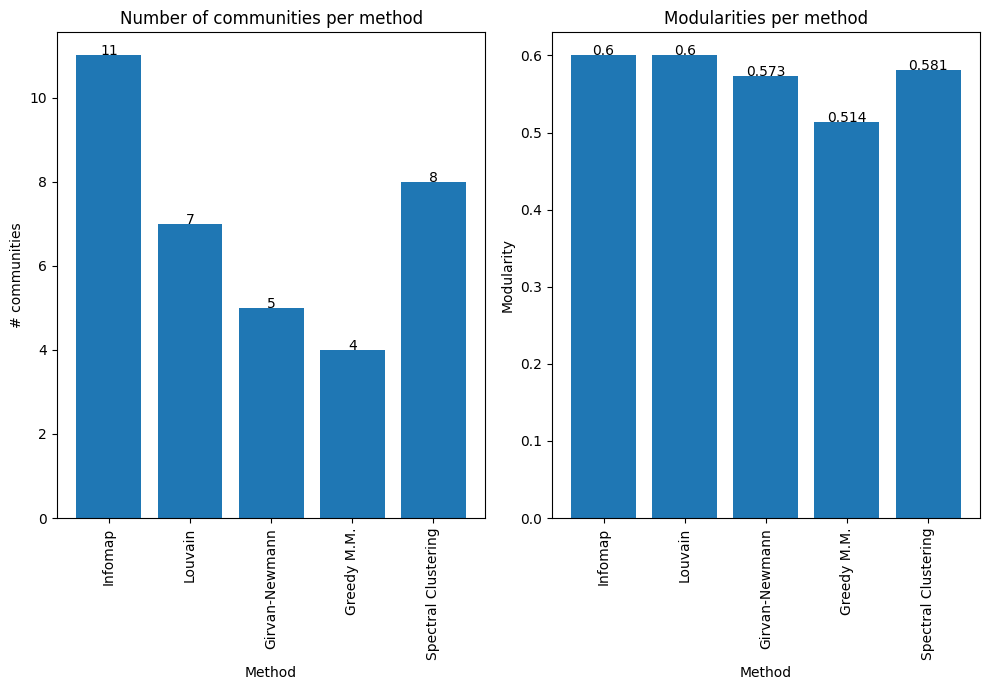

In [140]:
fig, axs = plt.subplots(1, 2, figsize=(10, 7))

# Number of communities per method
axs[0].bar(community_methods, n_communities)
for i, v in enumerate(n_communities):
    axs[0].text(i, v, str(v), ha='center', color='black')
axs[0].set_xlabel("Method")
axs[0].set_ylabel("# communities")
axs[0].set_title("Number of communities per method")
axs[0].set_xticks(range(len(community_methods)))
axs[0].set_xticklabels(community_methods, rotation='vertical')

# Modularities per method
axs[1].bar(community_methods, methods_modularity)
for i, v in enumerate(methods_modularity):
    axs[1].text(i, v, str(v), ha='center', color='black')
axs[1].set_xlabel("Method")
axs[1].set_ylabel("Modularity")
axs[1].set_title("Modularities per method")
axs[1].set_xticks(range(len(community_methods)))
axs[1].set_xticklabels(community_methods, rotation='vertical')

plt.tight_layout()
plt.show()

## Robustness

### Random Nodes Removal

In [141]:
import random
import numpy as np
import networkx as nx

random_seed = 30
random.seed(random_seed)

def random_removal(graph, nodes):
    graph_copy = graph.copy()
    nodes_to_remove = random.sample(list(graph_copy.nodes()), nodes)
    graph_copy.remove_nodes_from(nodes_to_remove)
    return graph_copy

random_res = {}
graphs = []
n_sample_to_remove = [5, 10, 15, 20, 25, 30, 35]

for i in n_sample_to_remove:
    new_graph = random_removal(G, i)
    a = nx.connected_components(new_graph)
    components = [len(c) for c in sorted(a, key=len, reverse=True)]

    # Compute all the new metrics
    betweenness_centrality = nx.betweenness_centrality(new_graph)
    closeness_centrality = nx.closeness_centrality(new_graph)
    harmonic_centrality = nx.harmonic_centrality(new_graph)
    degree_centrality = nx.degree_centrality(new_graph)

    try:
        eigenvector_centrality = nx.eigenvector_centrality(new_graph)
    except nx.PowerIterationFailedConvergence:
        eigenvector_centrality = {node: float('nan') for node in new_graph.nodes()}

    # Five most central nodes
    first5_bcen = list(dict(sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)).keys())[0:5]
    first5_ccen = list(dict(sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)).keys())[0:5]
    first5_ecen = list(dict(sorted(eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)).keys())[0:5]
    first5_charm = list(dict(sorted(harmonic_centrality.items(), key=lambda x: x[1], reverse=True)).keys())[0:5]
    first5_cdegree = list(dict(sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)).keys())[0:5]

    # Mean centrality
    mean_bcen = np.mean(list(betweenness_centrality.values()))
    mean_ccen = np.mean(list(closeness_centrality.values()))
    mean_ecen = np.mean(list(eigenvector_centrality.values()))
    mean_charm = np.mean(list(harmonic_centrality.values()))
    mean_cdegree = np.mean(list(degree_centrality.values()))

    # Metric about the giant component
    Gcc = sorted(nx.connected_components(new_graph), key=len, reverse=True)
    giant_component = new_graph.subgraph(Gcc[0])

    avg_shortest_path = nx.average_shortest_path_length(giant_component)
    d = nx.diameter(giant_component)

    # Dictionary
    random_res[i] = {
        'average shortest path': avg_shortest_path,
        'diameter': d,
        '5 most central nodes - betweenness centrality': first5_bcen,
        '5 most central nodes - closeness centrality': first5_ccen,
        '5 most central nodes - eigenvector centrality': first5_ecen,
        '5 most central nodes - harmonic centrality': first5_charm,
        '5 most central nodes - degree centrality': first5_cdegree,
        'Mean betweenness centrality': mean_bcen,
        'Mean closeness centrality': mean_ccen,
        'Mean eigenvector centrality': mean_ecen,
        'Mean harmonic centrality': mean_charm,
        'Mean degree centrality': mean_cdegree,
        'number of components': len(components)
    }
    graphs.append(new_graph)

# Output the results
for k, v in random_res.items():
    print(f"Nodes removed: {k}")
    for metric, value in v.items():
        print(f"{metric}: {value}")
    print("\n")


Nodes removed: 5
average shortest path: 3.3796583850931676
diameter: 7
5 most central nodes - betweenness centrality: ['NED', 'JOFFREY', 'STANNIS', 'JON', 'DAENERYS']
5 most central nodes - closeness centrality: ['JOFFREY', 'JAIME', 'NED', 'TYRION', 'CERSEI']
5 most central nodes - eigenvector centrality: ['JOFFREY', 'TYRION', 'CERSEI', 'SANSA', 'JAIME']
5 most central nodes - harmonic centrality: ['JOFFREY', 'TYRION', 'JAIME', 'CERSEI', 'SANSA']
5 most central nodes - degree centrality: ['JOFFREY', 'TYRION', 'CERSEI', 'SANSA', 'JON']
Mean betweenness centrality: 0.014155134734714763
Mean closeness centrality: 0.2936561510316057
Mean eigenvector centrality: 0.04165627096872366
Mean harmonic centrality: 55.1054297328688
Mean degree centrality: 0.04788268741583121
number of components: 2


Nodes removed: 10
average shortest path: 3.435973154362416
diameter: 8
5 most central nodes - betweenness centrality: ['JOFFREY', 'NED', 'STANNIS', 'JON', 'VARYS']
5 most central nodes - closeness cent

In [142]:
for i in n_sample_to_remove:
  print(random_res[i])

{'average shortest path': 3.3796583850931676, 'diameter': 7, '5 most central nodes - betweenness centrality': ['NED', 'JOFFREY', 'STANNIS', 'JON', 'DAENERYS'], '5 most central nodes - closeness centrality': ['JOFFREY', 'JAIME', 'NED', 'TYRION', 'CERSEI'], '5 most central nodes - eigenvector centrality': ['JOFFREY', 'TYRION', 'CERSEI', 'SANSA', 'JAIME'], '5 most central nodes - harmonic centrality': ['JOFFREY', 'TYRION', 'JAIME', 'CERSEI', 'SANSA'], '5 most central nodes - degree centrality': ['JOFFREY', 'TYRION', 'CERSEI', 'SANSA', 'JON'], 'Mean betweenness centrality': 0.014155134734714763, 'Mean closeness centrality': 0.2936561510316057, 'Mean eigenvector centrality': 0.04165627096872366, 'Mean harmonic centrality': 55.1054297328688, 'Mean degree centrality': 0.04788268741583121, 'number of components': 2}
{'average shortest path': 3.435973154362416, 'diameter': 8, '5 most central nodes - betweenness centrality': ['JOFFREY', 'NED', 'STANNIS', 'JON', 'VARYS'], '5 most central nodes - 

In [143]:
#Get the nodes that now are without any link
for i in range(len(n_sample_to_remove)):
  Gcc = sorted(nx.connected_components(graphs[i]), key=len, reverse=True)
  if len(Gcc) > 1:
    Gcc.pop(0)
    print("Isolated nodes in the network: ",i, "is", Gcc)

Isolated nodes in the network:  0 is [{'MEEREEN_SLAVE', 'ELDER_MEEREEN_SLAVE', 'MOSSADOR'}]
Isolated nodes in the network:  1 is [{'TANSY', 'BOLTON_GUARD', 'YARA', 'MYRANDA', 'FIRST_MATE'}, {'LHARA', 'SALLADHOR'}, {'ORYS', 'ORYS_BROTHER'}]
Isolated nodes in the network:  3 is [{'LHARA', 'SALLADHOR'}, {'RANDYLL'}]
Isolated nodes in the network:  4 is [{'DONNEL_HILL', 'COOPER'}, {'SELWYN'}, {'RENLY'}, {'RANDYLL'}]
Isolated nodes in the network:  6 is [{'MEEREEN_SLAVE', 'MOSSADOR'}, {'WHITE_WALKER', 'NIGHT_KING'}, {'BOROS'}]


In [144]:
# based on centrality

def centrality_removal(graph, nodes):
    graph_copy = graph.copy()
    nodes_to_remove = list(centrality_df["Most central character - Betweenness "][0:nodes]) #list of the nodes to remove
    graph_copy.remove_nodes_from(nodes_to_remove)   #remove the nodes
    return graph_copy

centrality_res = {}           #dictionary in with append the new metrics
graphs = []                   #list of the new graphs to visualize
n_sample_to_remove = [1,3,5]  #list of number of nodes to delete

for i in n_sample_to_remove:
    new_graph = centrality_removal(G, i)      #remove nodes
    a = nx.connected_components(new_graph)    #get the components
    components = [len(c) for c in sorted(a, key=len, reverse=True)] #count the number of componentes (>1 if disconnected)
    """
    if len(components) ==1:   #if the grapgh is connected (never in this graph)
      #compute all the new metrics
      d =  nx.diameter(new_graph)
      s = nx.shortest_path(new_graph)
      a_s = nx.average_shortest_path_length(new_graph)
      bcen = nx.betweenness_centrality(new_graph)
      ccen = nx.closeness_centrality(new_graph)
      ecen = nx.eigenvector_centrality(new_graph)
      centrality_res[i] = {'diameter' : d, 'shortest path': s, 'average shortest path': a_s, 'betwennes centrality': bcen, 'closeness centrality': ccen,'eigenvector centrality': ecen}
    else:   #if the grapgh isn't connected
    """
    #compute all the new metrics
    #five most central nodes
    first5_bcen = list(dict(sorted(nx.betweenness_centrality(new_graph).items(), key=lambda x:x[1], reverse=True)).keys())[0:5]
    first5_ccen = list(dict(sorted(nx.closeness_centrality(new_graph).items(), key=lambda x:x[1], reverse=True)).keys())[0:5]
    first5_ecen = list(dict(sorted(nx.eigenvector_centrality(new_graph).items(), key=lambda x:x[1], reverse=True)).keys())[0:5]
    first5_charm = list(dict(sorted(nx.harmonic_centrality(new_graph).items(), key=lambda x:x[1], reverse=True)).keys())[0:5]
    first5_cdegree = list(dict(sorted(nx.degree_centrality(new_graph).items(), key=lambda x:x[1], reverse=True)).keys())[0:5]

    #mean centrality
    mean_bcen = np.mean(list(nx.betweenness_centrality(new_graph).values()))
    mean_ccen = np.mean(list(nx.closeness_centrality(new_graph).values()))
    mean_ecen = np.mean(list(nx.eigenvector_centrality(new_graph).values()))
    mean_charm = np.mean(list(nx.harmonic_centrality(new_graph).values()))
    mean_cdegree = np.mean(list(nx.degree_centrality(new_graph).values()))

    #metric about the giant component - impossible to compute otherwise
    Gcc = sorted(nx.connected_components(new_graph), key=len, reverse=True)
    giant_component = G.subgraph(Gcc[0])

    avg_shortest_path = nx.average_shortest_path_length(giant_component)    #average shortest path
    d = nx.diameter(giant_component)                                        #diameter

    #dictionary
    centrality_res[i] = {'average shortest path': avg_shortest_path,
                         'diameter': d,
                         #'5 most central nodes - betwennes centrality': first5_bcen,
                         #'5 most central nodes - closeness centrality': first5_ccen,
                         #'5 most central nodes - eigenvector centrality': first5_ecen,
                         #'5 most central nodes - harmonic centrality': first5_ccen,
                         #'5 most central nodes - degree centrality': first5_ecen,
                         'Mean betwennes centrality': mean_bcen,
                         'Mean closeness centrality': mean_ccen,
                         'Mean eigenvector centrality': mean_ecen,
                         'Mean harmonic centrality': mean_ccen,
                         'Mean degree centrality': mean_ecen,
                         'number of components': len(components)}
    graphs.append(new_graph)

In [145]:
#Get the nodes that now are without any link

Gcc = sorted(nx.connected_components(graphs[0]), key=len, reverse=True)
Gcc.pop(0)
print("Isolated nodes in the first network: ",Gcc)

Gcc = sorted(nx.connected_components(graphs[1]), key=len, reverse=True)
Gcc.pop(0)
print("Isolated nodes in the second network: ",Gcc)

Gcc = sorted(nx.connected_components(graphs[2]), key=len, reverse=True)
Gcc.pop(0)
print("Isolated nodes in the third network: ",Gcc)

Isolated nodes in the first network:  [{'RENLY'}]
Isolated nodes in the second network:  [{'RENLY'}]
Isolated nodes in the third network:  [{'RENLY'}]


### Preferential Attachment - Link Prediction

In [146]:
#preferential attachment
preds = nx.preferential_attachment(G, list(nx.non_edges(G)))

first_node = []
sec_node = []
score = []

for u, v, p in preds:
  first_node.append(u)
  sec_node.append(v)
  score.append(p)

preferential_attachment = pd.DataFrame(data = list(zip(first_node, sec_node, score)),
                             columns = ['First node', 'Second node', 'Score'])

preferential_attachment = preferential_attachment.sort_values("Score", ascending=False)
preferential_attachment

,First node,Second node,Score
5419,JOFFREY,JON,1200
12214,TYRION,JON,1140
5402,JOFFREY,SAM,1000
11233,CERSEI,JON,990
12230,TYRION,SAM,950
...,...,...,...
13446,FALYSE,LHARA,1
6647,ORSON,LHARA,1
6088,WAYMAR_ROYCE,ORSON,1
6086,WAYMAR_ROYCE,MUSICIAN,1


### Node Prediction

In [147]:
#Returns a random graph using Barabási–Albert preferential attachment
#A graph of nodes is grown by attaching new nodes each with edges that are preferentially attached to existing nodes with high degree.

#the first number n is how many node we want to have in the new graph (old + new nodes)
#and the second number m is the umber of edges to attach from a new node to existing nodes

#Barabási–Albert network must have m >= 1 and m < n
one_node_one_edge = nx.barabasi_albert_graph(len(G.nodes())+1, 1, seed=30, initial_graph=G)

In [148]:
#adding a new node - preferential attachment
preds = nx.preferential_attachment(one_node_one_edge, one_node_one_edge.edges())

first_node = []
sec_node = []
score = []

for u, v, p in preds:
  first_node.append(u)
  sec_node.append(v)
  score.append(p)

preferential_attachment = pd.DataFrame(data = list(zip(first_node, sec_node, score)),
                             columns = ['First node', 'Second node', 'Score'])

preferential_attachment = preferential_attachment.sort_values("Score", ascending=False)
preferential_attachment[(preferential_attachment["First node"] == len(G)) | (preferential_attachment["Second node"] == len(G))]

,First node,Second node,Score
662,WHITE_WALKER,169,3


In [149]:
#Returns a random graph using Barabási–Albert preferential attachment
#A graph of nodes is grown by attaching new nodes each with edges that are preferentially attached to existing nodes with high degree.

#the first number n is how many node we want to have in the new graph (old + new nodes)
#and the second number m is the umber of edges to attach from a new node to existing nodes

#Barabási–Albert network must have m >= 1 and m < n
one_node_ten_edge = nx.barabasi_albert_graph(len(G.nodes())+1, 10, seed=30, initial_graph=G)

In [150]:
#adding a new node - preferential attachment
preds = nx.preferential_attachment(one_node_ten_edge, one_node_ten_edge.edges())

first_node = []
sec_node = []
score = []

for u, v, p in preds:
  first_node.append(u)
  sec_node.append(v)
  score.append(p)

preferential_attachment = pd.DataFrame(data = list(zip(first_node, sec_node, score)),
                             columns = ['First node', 'Second node', 'Score'])

preferential_attachment = preferential_attachment.sort_values("Score", ascending=False)
preferential_attachment[(preferential_attachment["First node"] == len(G)) | (preferential_attachment["Second node"] == len(G))]

,First node,Second node,Score
228,SANSA,169,320
71,JAIME,169,300
189,TYWIN,169,290
283,SAM,169,260
435,GRENN,169,220
472,ELLARIA,169,190
202,LITTLEFINGER,169,150
394,MISSANDEI,169,90
652,GUYMON,169,50
671,WHITE_WALKER,169,30


In [151]:
#Returns a random graph using Barabási–Albert preferential attachment
#A graph of nodes is grown by attaching new nodes each with edges that are preferentially attached to existing nodes with high degree.

#the first number n is how many node we want to have in the new graph (old + new nodes)
#and the second number m is the umber of edges to attach from a new node to existing nodes

#Barabási–Albert network must have m >= 1 and m < n
nodes_to_add = 10
ten_node_three_edge = nx.barabasi_albert_graph(len(G.nodes())+nodes_to_add, int(davg), seed=30, initial_graph=G)

In [152]:
#adding a new node - preferential attachment
preds = nx.preferential_attachment(ten_node_three_edge, ten_node_three_edge.edges())

first_node = []
sec_node = []
score = []

for u, v, p in preds:
  first_node.append(u)
  sec_node.append(v)
  score.append(p)

preferential_attachment = pd.DataFrame(data = list(zip(first_node, sec_node, score)),
                             columns = ['First node', 'Second node', 'Score'])

preferential_attachment = preferential_attachment.sort_values("Score", ascending=False)
filtered_preferential_attachment = preferential_attachment[(preferential_attachment['First node'].isin(np.arange(len(G.nodes()), len(G.nodes())+nodes_to_add))) |
                                                           (preferential_attachment['Second node'].isin(np.arange(len(G.nodes()), len(G.nodes())+nodes_to_add)))]
filtered_preferential_attachment

,First node,Second node,Score
406,JOFFREY,170,344
407,JOFFREY,172,301
408,JOFFREY,173,301
112,TYRION,175,280
113,TYRION,177,280
...,...,...,...
697,MEEREEN_CHAMPION,175,28
718,MANSERVANT,170,24
722,COOPER,174,21
727,INNKEEPERS_DAUGHTER,176,21


In [153]:
filtered_preferential_attachment_counts = filtered_preferential_attachment['First node'].value_counts()
filtered_preferential_attachment_counts

,count
First node,
LITTLEFINGER,4
ELLARIA,4
JOFFREY,3
JAIME,3
JORAH,2
STYR,2
TYRION,2
THEON,2
TORMUND,2


In [154]:
filtered_chars =  list(dict(filtered_preferential_attachment_counts).keys())[0:10]
filtered_values = list(dict(filtered_preferential_attachment_counts).values())[0:10]

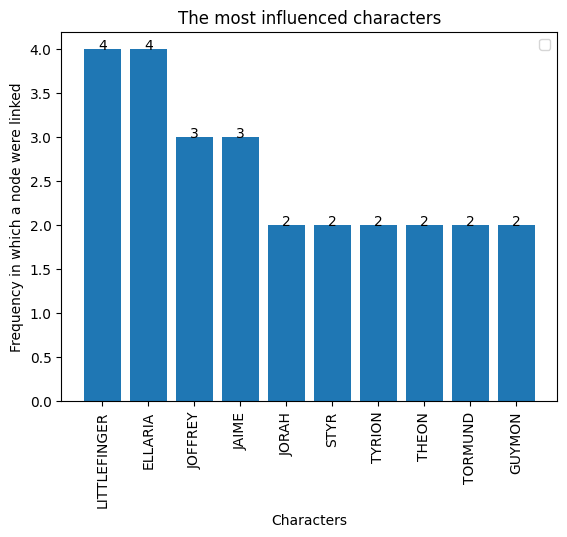

In [155]:
#Modularities per method

"""
Function that we'll use later for add the value in barplots
"""
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i, y[i], y[i], ha = 'center')

plt.bar(filtered_chars,filtered_values)
addlabels(filtered_chars,filtered_values)
plt.legend()
plt.xticks(rotation='vertical')
plt.xlabel("Characters")
plt.ylabel("Frequency in which a node were linked")
plt.title("The most influenced characters")
plt.show()